## 📚 Dataset& Project Overview 

Our dataset comprises details on 8,700 restaurants in Bangalore, including various features. Our initial goal is to conduct a comprehensive analysis of the food industry in Bangalore, with a focus on identifying the most prevalent restaurants, cuisines, and types of establishments. Once we've gained valuable insights from this analysis, we transition to the next phase, where we leverage the cleaned dataset to develop a restaurant recommendation system. We're employing four distinct approaches in building these recommendation algorithms. The ultimate aim is to use them solely or integrate these approaches to enhance our business case, ultimately providing a more robust and effective solution for assisting users in making restaurant choices.

## 📝 Features 

1. **`url`**: The URL associated with the restaurant's information.

2. **`address`**:The physical address of the restaurant, including the street and area.

3. **`name`**: The name of the restaurant.

4. **`online_order`**: Indicates whether the restaurant accepts online orders (Yes/No).

5. **`book_table`** : Indicates whether the restaurant allows customers to book tables in advance (Yes/No).

6. **`rate`** : The restaurant's rating, often based on customer reviews, displayed in a "X.X/5" format.

7. **`phone`** : The phone number for contacting the restaurant.

8. **`Votes`** : The number of votes or reviews received by the restaurant.

8. **`location`** : The neighborhood or area where the restaurant is located.

9. **`rest_type`** : The type or category of the restaurant (e.g., Quick Bites, Lounge, Casual Dining).

10. **`dish_liked`** : Specific dishes or menu items that are liked or popular at the restaurant.

11. **`cuisines`** :The types of cuisines or culinary styles offered by the restaurant.

12. **`reviews_list`** : A list of customer reviews or feedback about the restaurant.

13. **`eat_type`** : which method you eat with(dine out, delivery, etc)


## 📈Work Flow


1. **Import needed Libraries**

2. **Data Cleaning**

2. **Exploratory Data Analysis**: Perform exploratory data analysis to gain insights into the dataset

3. **Asking Questions to gain Insights**

4. **Feature Engineering**

5. **Modeling**


## Import Libraries 

In [326]:
!pip install missingno


Note: you may need to restart the kernel to use updated packages.


In [327]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd  
import matplotlib.pyplot as plt
import seaborn as sns
import re
from statistics import mean
from scipy.sparse import csc_matrix
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans
import warnings
from sklearn.metrics import silhouette_score
import missingno as mno

In [328]:
df= pd.read_csv(r"C:\Users\MBR\zomato.csv")
df_loc = pd.read_csv(r"C:\Users\MBR\zomato_lna_lat.csv")


In [329]:
df.sample(3)

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
40168,https://www.zomato.com/bangalore/shuchi-ruchi-...,"92, 1st Main, 10th Cross Temple Road, Sampige ...",Shuchi Ruchi,Yes,No,4.0 /5,340,+91 9448804902\n+91 7996992068,Malleshwaram,Quick Bites,"Aloo Palya, Masala Poori, Panipuri, Rolls, Cha...","Chinese, North Indian, Street Food",350,"[('Rated 5.0', 'RATED\n If you crave for CTR ...","['Gobi Manchurian', 'Paneer Manchurian', 'Pane...",Dine-out,Malleshwaram
25906,https://www.zomato.com/bangalore/belgian-waffl...,"5M/406, Ground Floor, 2nd Block extension, Hen...",Belgian Waffle Factory,Yes,No,4.8/5,265,+91 9481511911,Kalyan Nagar,Dessert Parlor,"Chocolate Waffles, Chocolate Overload, Oreo Wa...",Desserts,400,"[('Rated 4.0', 'RATED\n We ordered the sin wa...",[],Desserts,Kammanahalli
11130,https://www.zomato.com/bangalore/kaizen-wellne...,"72/A, 3rd Floor, Bangalore 15th Cross Road 100...",Kaizen Wellness Kitchen,Yes,No,3.7/5,37,+91 8105412345\r\r\n+91 8105312345,JP Nagar,Casual Dining,NaN,"Asian, Continental, European",800,"[('Rated 4.0', 'RATED\n Me and my friend were...",[],Dine-out,BTM


In [330]:
df.shape

(51717, 17)

In [331]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51717 entries, 0 to 51716
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   url                          51717 non-null  object
 1   address                      51717 non-null  object
 2   name                         51717 non-null  object
 3   online_order                 51717 non-null  object
 4   book_table                   51717 non-null  object
 5   rate                         43942 non-null  object
 6   votes                        51717 non-null  int64 
 7   phone                        50509 non-null  object
 8   location                     51696 non-null  object
 9   rest_type                    51490 non-null  object
 10  dish_liked                   23639 non-null  object
 11  cuisines                     51672 non-null  object
 12  approx_cost(for two people)  51371 non-null  object
 13  reviews_list                 51

In [332]:
df.columns

Index(['url', 'address', 'name', 'online_order', 'book_table', 'rate', 'votes',
       'phone', 'location', 'rest_type', 'dish_liked', 'cuisines',
       'approx_cost(for two people)', 'reviews_list', 'menu_item',
       'listed_in(type)', 'listed_in(city)'],
      dtype='object')

In [333]:
df.duplicated().sum()

0

In [334]:
df.isna().sum()

url                                0
address                            0
name                               0
online_order                       0
book_table                         0
rate                            7775
votes                              0
phone                           1208
location                          21
rest_type                        227
dish_liked                     28078
cuisines                          45
approx_cost(for two people)      346
reviews_list                       0
menu_item                          0
listed_in(type)                    0
listed_in(city)                    0
dtype: int64

<Axes: >

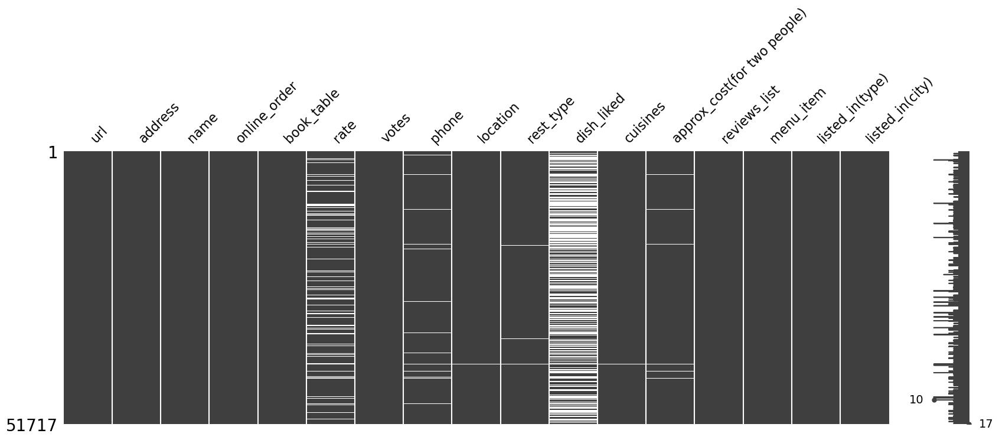

In [335]:
# way to visualize the missing values
mno.matrix(df, figsize = (20, 6))

* This is the visulaization of missing values to be handled during the upcoming section.

In [149]:
df.describe()

,votes
count,51717.000000
mean,283.697527
std,803.838853
min,0.000000
25%,7.000000
50%,41.000000
75%,198.000000
max,16832.000000


In [150]:
df.describe(include='object')

,url,address,name,online_order,book_table,rate,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
count,51717,51717,51717,51717,51717,43942,50509,51696,51490,23639,51672,51371,51717,51717,51717,51717
unique,51717,11495,8792,2,2,64,14926,93,93,5271,2723,70,22513,9098,7,30
top,https://www.zomato.com/bangalore/jalsa-banasha...,Delivery Only,Cafe Coffee Day,Yes,No,NEW,080 43334321,BTM,Quick Bites,Biryani,North Indian,300,[],[],Delivery,BTM
freq,1,128,96,30444,45268,2208,216,5124,19132,182,2913,7576,7595,39617,25942,3279


* The votes is appeared to include outliers as the mean and std are so far away from eachother 

<Axes: >

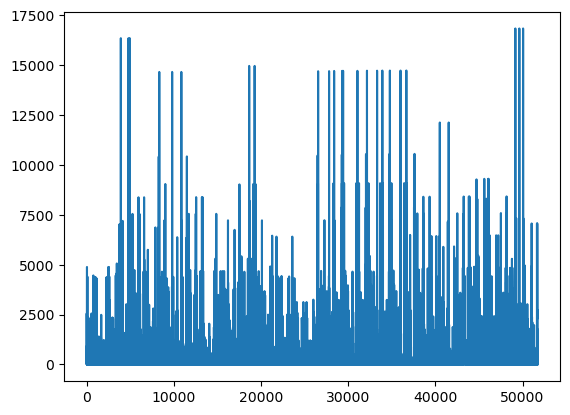

In [151]:
df.votes.plot()

#### Now the next step is data cleaning and feature engineering for this step we need to do a lot of stuff with the data such as:

- Changing the column names
- Analysing each column
- Deleting Unnecessary Columns
- Remove the NaN values from the dataset

In [336]:
df1= df.copy()
df2=df_loc.copy()

In [337]:
# rename cols

df1.rename(columns={"approx_cost(for two people)": "approx_cost_2P",
                   "listed_in(type)": "eat_type",
                   "listed_in(city)": "neighborhood",
                   "location": "city"},
                   inplace= True);

df2.rename(columns={"approx_cost(for two people)": "approx_cost_2P",
                   "listed_in(type)": "eat_type",
                   "listed_in(city)": "neighborhood",
                   "location": "city"},
                   inplace= True);

In [338]:
df1.columns

Index(['url', 'address', 'name', 'online_order', 'book_table', 'rate', 'votes',
       'phone', 'city', 'rest_type', 'dish_liked', 'cuisines',
       'approx_cost_2P', 'reviews_list', 'menu_item', 'eat_type',
       'neighborhood'],
      dtype='object')

In [339]:
df2.columns

Index(['url', 'address', 'Latitude', 'Longitude', 'name', 'online_order',
       'book_table', 'rate', 'votes', 'phone', 'city', 'rest_type',
       'dish_liked', 'cuisines', 'approx_cost_2P', 'reviews_list', 'menu_item',
       'eat_type', 'neighborhood'],
      dtype='object')

---

#### Analysing Rating column

In [340]:
df1['rate'].unique()

array(['4.1/5', '3.8/5', '3.7/5', '3.6/5', '4.6/5', '4.0/5', '4.2/5',
       '3.9/5', '3.1/5', '3.0/5', '3.2/5', '3.3/5', '2.8/5', '4.4/5',
       '4.3/5', 'NEW', '2.9/5', '3.5/5', nan, '2.6/5', '3.8 /5', '3.4/5',
       '4.5/5', '2.5/5', '2.7/5', '4.7/5', '2.4/5', '2.2/5', '2.3/5',
       '3.4 /5', '-', '3.6 /5', '4.8/5', '3.9 /5', '4.2 /5', '4.0 /5',
       '4.1 /5', '3.7 /5', '3.1 /5', '2.9 /5', '3.3 /5', '2.8 /5',
       '3.5 /5', '2.7 /5', '2.5 /5', '3.2 /5', '2.6 /5', '4.5 /5',
       '4.3 /5', '4.4 /5', '4.9/5', '2.1/5', '2.0/5', '1.8/5', '4.6 /5',
       '4.9 /5', '3.0 /5', '4.8 /5', '2.3 /5', '4.7 /5', '2.4 /5',
       '2.1 /5', '2.2 /5', '2.0 /5', '1.8 /5'], dtype=object)

In [341]:
df2['rate'].unique()

array(['4.1/5', '3.8/5', '3.7/5', '3.6/5', '4.6/5', '4.0/5', '4.2/5',
       '3.9/5', '3.1/5', '3.0/5', '3.2/5', '3.3/5', '2.8/5', '4.4/5',
       '4.3/5', 'NEW', '2.9/5', '3.5/5', nan, '2.6/5', '3.8 /5', '3.4/5',
       '4.5/5', '2.5/5', '2.7/5', '4.7/5', '2.4/5', '2.2/5', '2.3/5',
       '3.4 /5', '-', '3.6 /5', '4.8/5', '3.9 /5', '4.2 /5', '4.0 /5',
       '4.1 /5', '3.7 /5', '3.1 /5', '2.9 /5', '3.3 /5', '2.8 /5',
       '3.5 /5', '2.7 /5', '2.5 /5', '3.2 /5', '2.6 /5', '4.5 /5',
       '4.3 /5', '4.4 /5', '4.9/5', '2.1/5'], dtype=object)

* Fill with real data & apply text preprocessing methods to reach our final output. 

In [342]:
pattern = re.compile(r'\(([^)]*)\)')
def fill_rate(x):
    ratings= []
    list_of_ratings= pattern.findall(x)
    if len(list_of_ratings):
        for rate in list_of_ratings:
            rate = rate[:15]
            rate= re.findall(r"[-+]?(?:\d*\.*\d+)", rate)
            try:
                ratings.append(float(rate[0]))
            except:
                pass
    else:
        return np.nan
    
    return round(mean(ratings), 1)

In [343]:
df1['rate']= df1.apply(lambda x : fill_rate(x.reviews_list) if pd.isnull(x.rate) or x.rate == 'NEW' or x.rate == '-' else x.rate, axis=1)
df1.rate.iloc[41214] = 1

In [344]:
df2['rate']= df2.apply(lambda x : fill_rate(x.reviews_list) if pd.isnull(x.rate) or x.rate == 'NEW' or x.rate == '-' else x.rate, axis=1)


In [345]:
def remove_slash(value):
    if(value=='NEW' or value=='-'):
        return 2.5
    else:
        value=str(value).split('/')
        value=value[0]
        return float(value)

df1.rate=df1.rate.apply(remove_slash)

# fill with mean
df1.rate.fillna(round(df1.rate.mean(), 1), inplace=True)

In [346]:
def remove_slash(value):
    if(value=='NEW' or value=='-'):
        return 2.5
    else:
        value=str(value).split('/')
        value=value[0]
        return float(value)

df2.rate=df2.rate.apply(remove_slash)

# fill with mean
df2.rate.fillna(round(df2.rate.mean(), 1), inplace=True)

In [347]:
df1['rate'].unique()

array([ 4.1,  3.8,  3.7,  3.6,  4.6,  4. ,  4.2,  3.9,  3.1,  3. ,  3.2,
        3.3,  2.8,  4.4,  4.3,  4.5,  2.9,  3.5,  1. ,  2.6,  3.4,  5. ,
        2.5,  2.7,  2. ,  4.7,  4.8,  1.8,  2.4,  2.2,  2.3,  4.9,  1.5,
        2.1,  1.3,  1.4,  1.2,  1.6,  1.9, 10.1,  9.3,  1.7])

In [349]:
df2['rate'].unique()

array([4.1, 3.8, 3.7, 3.6, 4.6, 4. , 4.2, 3.9, 3.1, 3. , 3.2, 3.3, 2.8,
       4.4, 4.3, 4.5, 2.9, 3.5, 1. , 2.6, 3.4, 5. , 2.5, 2.7, 2. , 4.7,
       4.8, 1.8, 2.4, 2.2, 2.3, 4.9, 1.5, 2.1, 1.3])

* The rate values in the main data and our sample data after cleaning it .

---

#### Analysing city column

fill missing data for city

In [165]:
def fill_city(x):
    return x.split(',')[-2].strip()

df1['city']= df1.apply(lambda x : fill_city(x.address) if pd.isnull(x.city) else x.city, axis=1)

In [166]:
def fill_city(x):
    return x.split(',')[-2].strip()

df2['city']= df1.apply(lambda x : fill_city(x.address) if pd.isnull(x.city) else x.city, axis=1)

In [167]:
df1.city.value_counts()

BTM                      5124
HSR                      2523
Koramangala 5th Block    2504
JP Nagar                 2235
Whitefield               2144
                         ... 
Jakkur                      3
Rajarajeshwari Nagar        2
Cholourpalya                2
Govindaraja Nagar           1
Peenya                      1
Name: city, Length: 95, dtype: int64

In [355]:
city = df1['city'].value_counts()
# Storing all the city that have accured less than 1000 times in the dataframes
city_lessthan_500 = city[city < 500]
city_lessthan_500

Domlur                           496
Ejipura                          439
Vasanth Nagar                    295
Jeevan Bhima Nagar               272
Koramangala 3rd Block            216
Kumaraswamy Layout               195
Thippasandra                     194
Basaveshwara Nagar               191
Nagawara                         187
Seshadripuram                    165
Hennur                           161
Majestic                         155
HBR Layout                       153
Yeshwantpur                      119
Varthur Main Road, Whitefield    117
ITPL Main Road, Whitefield       113
Hosur Road                       102
Koramangala 2nd Block            102
Kaggadasapura                    101
Sanjay Nagar                      76
Sadashiv Nagar                    63
Sahakara Nagar                    53
Koramangala                       48
Magadi Road                       34
Rammurthy Nagar                   32
Langford Town                     27
Sankey Road                       27
O

In [356]:
city=df2.city.value_counts()
# Storing all the city that have accured less than 50 times in the dataframes
city_lessthan_500=city[city<50]
city_lessthan_500

Series([], Name: city, dtype: int64)

In [357]:
def handle_city(value):
    # if value is in the list then change it to other
    if(value in city_lessthan_500):
        return 'others'
    else:
        return value
    
df1.city=df1.city.apply(handle_city)
df1.city.value_counts()

others                           22293
BTM                               5124
HSR                               2523
JP Nagar                          2235
Jayanagar                         1926
Marathahalli                      1846
Bannerghatta Road                 1630
Bellandur                         1286
Koramangala 6th Block             1156
Sarjapur Road                     1065
Banashankari                       906
Kalyan Nagar                       853
Malleshwaram                       725
Basavanagudi                       684
Banaswadi                          664
Brookefield                        658
New BEL Road                       649
Kammanahalli                       648
Rajajinagar                        591
Domlur                             496
Ejipura                            439
Vasanth Nagar                      295
Jeevan Bhima Nagar                 272
Koramangala 3rd Block              216
Kumaraswamy Layout                 195
Thippasandra             

--------

In [358]:
df2.city=df2.city.apply(handle_city)
df2.city.value_counts()

Bannerghatta Road     766
Banashankari          762
Bellandur             624
JP Nagar              598
Jayanagar             550
Basavanagudi          511
Sarjapur Road         359
others                324
BTM                   295
Marathahalli          140
HSR                    92
Kumaraswamy Layout     68
Name: city, dtype: int64

* After handling the city column and put the values of less frequent cities in others.

#### Analysing approx_cost_2P column

In [359]:
df1.approx_cost_2P.unique()

array(['800', '300', '600', '700', '550', '500', '450', '650', '400',
       '900', '200', '750', '150', '850', '100', '1,200', '350', '250',
       '950', '1,000', '1,500', '1,300', '199', '80', '1,100', '160',
       '1,600', '230', '130', '50', '190', '1,700', nan, '1,400', '180',
       '1,350', '2,200', '2,000', '1,800', '1,900', '330', '2,500',
       '2,100', '3,000', '2,800', '3,400', '40', '1,250', '3,500',
       '4,000', '2,400', '2,600', '120', '1,450', '469', '70', '3,200',
       '60', '560', '240', '360', '6,000', '1,050', '2,300', '4,100',
       '5,000', '3,700', '1,650', '2,700', '4,500', '140'], dtype=object)

In [360]:
def handlecost(value):
    value=str(value)
    if ',' in value:
        # we are simpling Replacing "," With no value ""
        value= value.replace(',','')
        return int(value)
    else:
        try:
            return int(value)
        except:
            pass
df1.approx_cost_2P=df1.approx_cost_2P.apply(handlecost)
df1.approx_cost_2P.unique()

array([ 800.,  300.,  600.,  700.,  550.,  500.,  450.,  650.,  400.,
        900.,  200.,  750.,  150.,  850.,  100., 1200.,  350.,  250.,
        950., 1000., 1500., 1300.,  199.,   80., 1100.,  160., 1600.,
        230.,  130.,   50.,  190., 1700.,   nan, 1400.,  180., 1350.,
       2200., 2000., 1800., 1900.,  330., 2500., 2100., 3000., 2800.,
       3400.,   40., 1250., 3500., 4000., 2400., 2600.,  120., 1450.,
        469.,   70., 3200.,   60.,  560.,  240.,  360., 6000., 1050.,
       2300., 4100., 5000., 3700., 1650., 2700., 4500.,  140.])

In [361]:
df2.approx_cost_2P=df2.approx_cost_2P.apply(handlecost)
df2.approx_cost_2P.unique()

array([ 800.,  300.,  600.,  700.,  550.,  500.,  450.,  650.,  400.,
        900.,  200.,  750.,  150.,  850.,  100., 1200.,  350.,  250.,
        950., 1000., 1500., 1300.,  199.,   80., 1100.,  160., 1600.,
        230.,  130.,   50.,  190., 1700.,   nan, 1400.,  180., 1350.,
       2200., 2000., 1800., 1900.,  330., 2500., 2100., 3000., 2800.,
       3400.])

In [362]:
df1.approx_cost_2P.fillna(round(df1.approx_cost_2P.mean(), 1), inplace=True)

In [363]:
df2.approx_cost_2P.fillna(round(df2.approx_cost_2P.mean(), 1), inplace=True)

In [364]:
df1.approx_cost_2P.unique()

array([ 800. ,  300. ,  600. ,  700. ,  550. ,  500. ,  450. ,  650. ,
        400. ,  900. ,  200. ,  750. ,  150. ,  850. ,  100. , 1200. ,
        350. ,  250. ,  950. , 1000. , 1500. , 1300. ,  199. ,   80. ,
       1100. ,  160. , 1600. ,  230. ,  130. ,   50. ,  190. , 1700. ,
        555.4, 1400. ,  180. , 1350. , 2200. , 2000. , 1800. , 1900. ,
        330. , 2500. , 2100. , 3000. , 2800. , 3400. ,   40. , 1250. ,
       3500. , 4000. , 2400. , 2600. ,  120. , 1450. ,  469. ,   70. ,
       3200. ,   60. ,  560. ,  240. ,  360. , 6000. , 1050. , 2300. ,
       4100. , 5000. , 3700. , 1650. , 2700. , 4500. ,  140. ])

* After handling and fill cost values.

----

### Analysing rest_type & cusines column

In [365]:
rest_types=df1.rest_type.value_counts()
rest_type_lessthan_1000=rest_types[rest_types<1000]

def handle_rest_type(value):
    # if value is in the list then change it to other
    if(value in rest_type_lessthan_1000):
        return 'others'
    else:
        return value

df1.rest_type=df1.rest_type.apply(handle_rest_type)
df1.rest_type.value_counts()


Quick Bites           19132
Casual Dining         10330
others                 9097
Cafe                   3732
Delivery               2604
Dessert Parlor         2263
Takeaway, Delivery     2037
Casual Dining, Bar     1154
Bakery                 1141
Name: rest_type, dtype: int64

* cuisine with count less than 1000 in others 

In [366]:
rest_types=df2.rest_type.value_counts()
rest_type_lessthan_1000=rest_types[rest_types<50]

def handle_rest_type(value):
    # if value is in the list then change it to other
    if(value in rest_type_lessthan_1000):
        return 'others'
    else:
        return value

df2.rest_type=df2.rest_type.apply(handle_rest_type)
df2.rest_type.value_counts()

Quick Bites           2006
Casual Dining         1069
others                 539
Cafe                   367
Dessert Parlor         251
Delivery               231
Takeaway, Delivery     163
Bakery                 143
Food Court              91
Beverage Shop           82
Casual Dining, Bar      72
Sweet Shop              52
Name: rest_type, dtype: int64

In [367]:
cuisiness = df1.cuisines.value_counts()
cuisiness_less_than_100= cuisiness[cuisiness<100]
cuisiness_less_than_100

def handle_cuisiness(value):
    if value in cuisiness_less_than_100:
        return 'others'
    else:
        return value
    
df1.cuisines=df.cuisines.apply(handle_cuisiness)
df1.cuisines.value_counts()

others                                 26460
North Indian                            2913
North Indian, Chinese                   2385
South Indian                            1828
Biryani                                  918
                                       ...  
South Indian, Chinese, North Indian      105
Italian, Pizza                           105
North Indian, Mughlai, Chinese           104
South Indian, Fast Food                  104
North Indian, Chinese, Seafood           102
Name: cuisines, Length: 70, dtype: int64

In [368]:
cuisiness = df2.cuisines.value_counts()
cuisiness_less_than_100= cuisiness[cuisiness<1]
cuisiness_less_than_100

def handle_cuisiness(value):
    if value in cuisiness_less_than_100:
        return 'others'
    else:
        return value
    
df2.cuisines=df2.cuisines.apply(handle_cuisiness)
df2.cuisines.value_counts()

North Indian                           311
South Indian                           271
North Indian, Chinese                  260
Bakery, Desserts                       114
South Indian, North Indian, Chinese    104
                                      ... 
Continental, Finger Food                 1
Sandwich, Fast Food                      1
North Indian, Chinese, Kebab             1
North Indian, BBQ, Biryani, Kebab        1
Continental, Cafe                        1
Name: cuisines, Length: 994, dtype: int64

---

In [369]:
df1=df1.drop(['url','phone','dish_liked','menu_item'], axis=1)
df1.head()

,address,name,online_order,book_table,rate,votes,city,rest_type,cuisines,approx_cost_2P,reviews_list,eat_type,neighborhood
0,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",Buffet,Banashankari
1,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,others,800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",Buffet,Banashankari
2,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,Banashankari,others,others,800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",Buffet,Banashankari
3,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",Buffet,Banashankari
4,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,others,600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",Buffet,Banashankari


* Drop un needed columns for our case 

In [370]:
df2=df2.drop(['url','phone','dish_liked','reviews_list','menu_item'], axis=1)
df2.head()

,address,Latitude,Longitude,name,online_order,book_table,rate,votes,city,rest_type,cuisines,approx_cost_2P,eat_type,neighborhood
0,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",12.926865,77.550920,Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800.0,Buffet,Banashankari
1,"1112, Next to KIMS Medical College, 17th Cross...",12.982465,77.537233,San Churro Cafe,Yes,No,3.8,918,Banashankari,others,"Cafe, Mexican, Italian",800.0,Buffet,Banashankari
2,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",12.923441,77.551194,Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300.0,Buffet,Banashankari
3,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",12.946119,77.570255,Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600.0,Buffet,Banashankari
4,"37, 5-1, 4th Floor, Bosco Court, Gandhi Bazaar...",12.946119,77.570255,Timepass Dinner,Yes,No,3.8,286,Basavanagudi,Casual Dining,North Indian,600.0,Buffet,Banashankari


In [371]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51717 entries, 0 to 51716
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   address         51717 non-null  object 
 1   name            51717 non-null  object 
 2   online_order    51717 non-null  object 
 3   book_table      51717 non-null  object 
 4   rate            51717 non-null  float64
 5   votes           51717 non-null  int64  
 6   city            51696 non-null  object 
 7   rest_type       51490 non-null  object 
 8   cuisines        51672 non-null  object 
 9   approx_cost_2P  51717 non-null  float64
 10  reviews_list    51717 non-null  object 
 11  eat_type        51717 non-null  object 
 12  neighborhood    51717 non-null  object 
dtypes: float64(2), int64(1), object(10)
memory usage: 5.1+ MB


In [372]:
df1.isna().sum()

address             0
name                0
online_order        0
book_table          0
rate                0
votes               0
city               21
rest_type         227
cuisines           45
approx_cost_2P      0
reviews_list        0
eat_type            0
neighborhood        0
dtype: int64

In [373]:
df1.dropna(inplace=True)
df1.shape

(51466, 13)

In [374]:
df2.isna().sum()

address            0
Latitude          15
Longitude         15
name               0
online_order       0
book_table         0
rate               0
votes              0
city               1
rest_type         24
cuisines           5
approx_cost_2P     0
eat_type           0
neighborhood       0
dtype: int64

In [375]:
df2.dropna(inplace=True)
df2.shape

(5047, 14)

<Axes: >

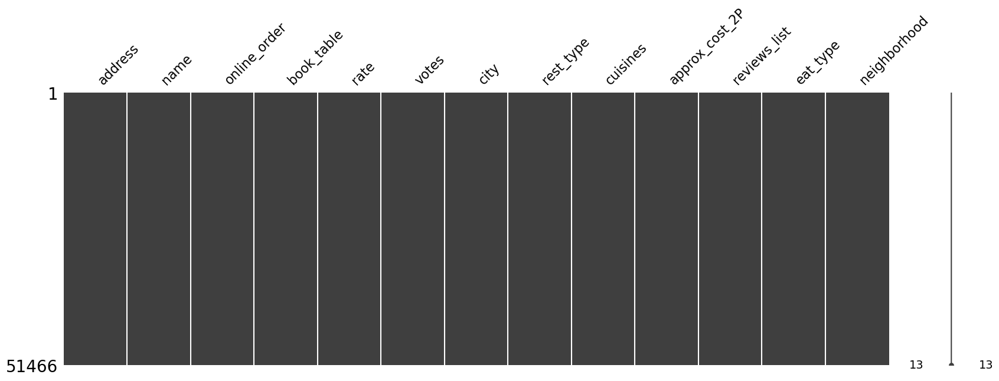

In [376]:
# way to visualize the missing values
mno.matrix(df1, figsize = (20, 6))

* The data is cleaned and ready to use in EDA and Modeling 

<Axes: >

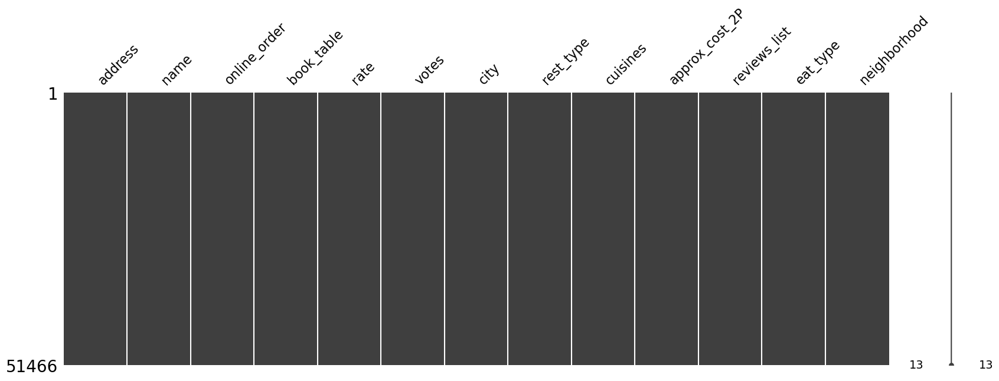

In [378]:
# way to visualize the missing values
mno.matrix(df1, figsize = (20, 6))

* NO missing values after Handling it with different approaches as illustrated above

# EDA

* Let's begin our EDA analysis by revisting the no of unique restaurants we have.
* No.of unique users, unique restaurants, no. of ratings.


In [189]:
df1.columns

Index(['address', 'name', 'online_order', 'book_table', 'rate', 'votes',
       'city', 'rest_type', 'cuisines', 'approx_cost_2P', 'reviews_list',
       'eat_type', 'neighborhood'],
      dtype='object')

In [190]:
print('Unique restaurant: ', df1['name'].nunique())
print('Unique neighborhood: ', df1['neighborhood'].nunique())

Unique restaurant:  8755
Unique neighborhood:  30


In [191]:
print('Unique restaurant: ', df2['name'].nunique())
print('Unique neighborhood: ', df2['neighborhood'].nunique())
print('Unique rate: ', df2['rate'].nunique())

Unique restaurant:  2463
Unique neighborhood:  5
Unique rate:  35


### Customer Preferences and Ratings
* what is the top 10 restraurant according to customer ratings?
* which online order type has highest rates ?
*  Which type of restaurant (Casual Dining, Cafe, Quick Bites, etc.) tends to receive the highest ratings?
* Is there a correlation between the number of votes and the restaurant's rating?
* what is the most popular eat type ?


####  what is the top 10 restraurant according to customer ratings?


In [192]:
# Use the 'groupby' function to group the data by restaurant name and count the ratings
restaurant_ratings_count = df1['rate'].groupby(df1['name']).count().reset_index()

# Rename the columns for clarity
restaurant_ratings_count.columns = ['Restaurant Name', 'Number of Ratings']

# Sort the restaurants by the number of ratings in descending order
restaurant_ratings_count = restaurant_ratings_count.sort_values(by='Number of Ratings', ascending=False)
# Filter restaurants with more than 30 ratings
restaurant_ratings_count = restaurant_ratings_count[restaurant_ratings_count['Number of Ratings'] > 20]

# Print the filtered result
restaurant_ratings_count


,Restaurant Name,Number of Ratings
1315,Cafe Coffee Day,96
5526,Onesta,85
3774,Just Bake,73
2436,Empire Restaurant,71
2567,Five Star Chicken,70
...,...,...
4638,Mangalore Lunch Home,21
7763,The Chef's Cake & Bakes,21
3401,House Of Commons,21
3084,Hari Super Sandwich,21


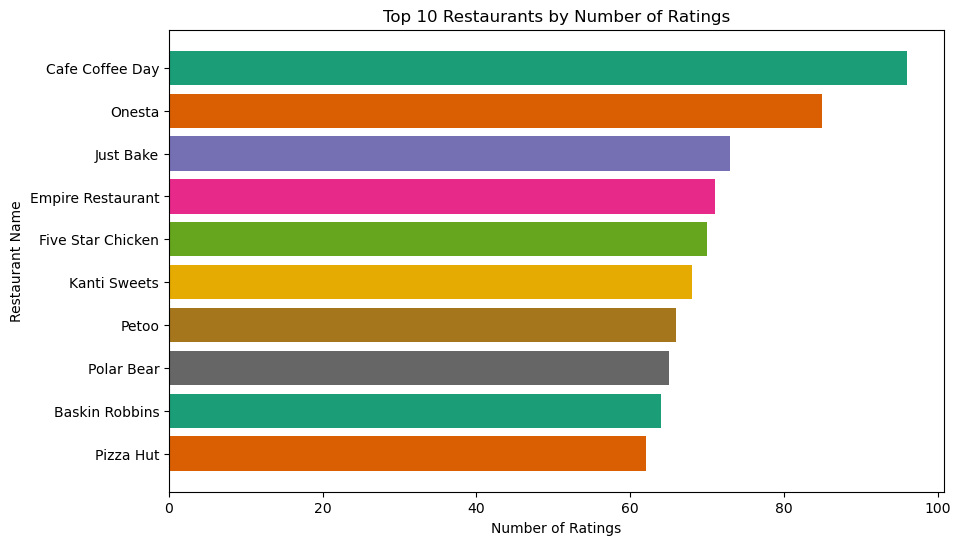

In [193]:
import matplotlib.pyplot as plt
import seaborn as sns


top_restaurants = restaurant_ratings_count.head(10)

# Define a custom color palette (in this case, using "Dark2")
colors = sns.color_palette("Dark2", len(top_restaurants))

# Create the horizontal bar chart with the custom colors
plt.figure(figsize=(10, 6))
bars = plt.barh(top_restaurants['Restaurant Name'], top_restaurants['Number of Ratings'], color=colors)
plt.xlabel('Number of Ratings')
plt.ylabel('Restaurant Name')
plt.title('Top 10 Restaurants by Number of Ratings')
plt.gca().invert_yaxis()

plt.show()


* Top restaurants in our data set

#### Which ordering Type does customer prefer?

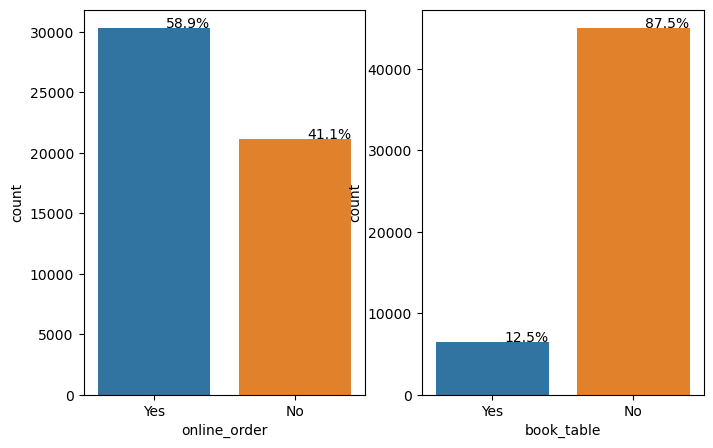

In [194]:
plt.figure(figsize=(8,5))
total = float(len(df1))
plt.subplot(1,2,1)
ay=sns.countplot(x="online_order",data=df1)
for p in ay.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ay.annotate(percentage, (x, y),ha='right')
plt.subplot(1,2,2)
ax = sns.countplot(x="book_table",  data=df1)
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.show()

* About 60% of the customers prefer online ordering over offline ordering.
* Huge percent of customers tend to NOT BOOKING table before going to the restaurant.
* Use website for online ordering will be perfect

####  Which type of restaurant (Casual Dining, Cafe, Quick Bites, etc.) tends to receive the highest ratings?

In [195]:
!pip install plotly

In [196]:
!pip install folium

In [381]:
# Group the DataFrame by 'rest_type' and calculate the rating count for each group
rating_count_by_rest_type = df1.groupby('rest_type')['rate'].count().reset_index()

rating_count_by_rest_type.columns = ['Restaurant Type', 'Rating Count']

rating_count_by_rest_type = rating_count_by_rest_type.sort_values(by='Rating Count', ascending=False)

rating_count_by_rest_type

,Restaurant Type,Rating Count
6,Quick Bites,19129
2,Casual Dining,10326
8,others,9092
1,Cafe,3732
4,Delivery,2595
5,Dessert Parlor,2262
7,"Takeaway, Delivery",2035
3,"Casual Dining, Bar",1154
0,Bakery,1141


In [385]:
# Define a color palette (you can customize this)
colors = px.colors.qualitative.Set1

# Create the bar chart with different colors for each 'rest_type'
fig = px.bar(rating_count_by_rest_type, x='Restaurant Type', y='Rating Count',
             labels={'Rating Count': 'Rating Count', 'Restaurant Type': 'Restaurant Type'},
             title='Rating Count for Each Restaurant Type',
             color='Restaurant Type',  # Use 'Restaurant Type' for color differentiation
             color_discrete_sequence=colors)  # Specify the color palette

fig.show()


* Quick bytes restaurant type has the highest ratings 

* Quick bites restaurant types are most popular and india has variety of restaurant types 

#### Is there a correlation between the number of votes and the restaurant's rating?

In [386]:
df1.columns

Index(['address', 'name', 'online_order', 'book_table', 'rate', 'votes',
       'city', 'rest_type', 'cuisines', 'approx_cost_2P', 'reviews_list',
       'eat_type', 'neighborhood'],
      dtype='object')

In [387]:
df_correlate=df1[['votes','rate']]

In [388]:
df_correlate

,votes,rate
0,775,4.1
1,787,4.1
2,918,3.8
3,88,3.7
4,166,3.8
...,...,...
51712,27,3.6
51713,0,3.7
51714,0,3.7
51715,236,4.3


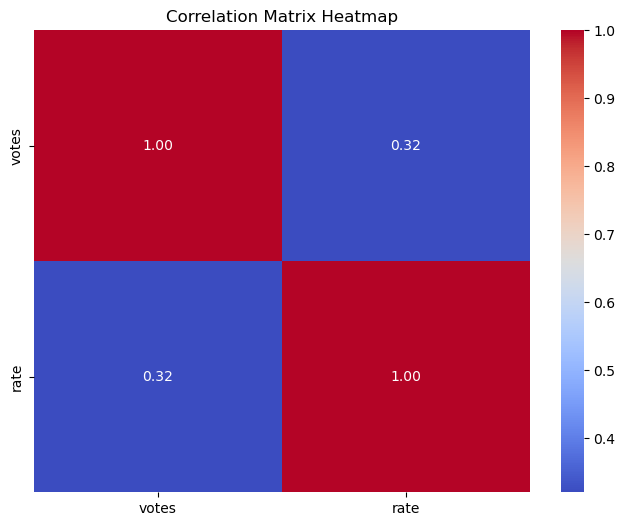

In [389]:
correlation_matrix = df_correlate.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix Heatmap")
plt.show()


* Yes, there exists moderate positive correlation between these two but low correlation

Nearly moderate correlation 

<Axes: xlabel='online_order', ylabel='rate'>

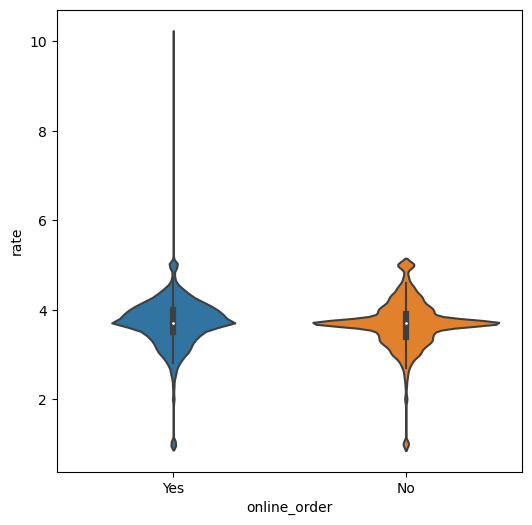

In [390]:
plt.figure(figsize=(6,6))
sns.violinplot(x='online_order', y='rate', data=df1)

* violin chart explain the relation between online order and rate in clear way as the NO online order suffers from high outliers and less precent.

In [391]:
X=df1[df1['rate']==5]

In [392]:
df1.name.unique()

array(['Jalsa', 'Spice Elephant', 'San Churro Cafe', ..., 'Nawabs Empire',
       'SeeYa Restaurant',
       'Plunge - Sheraton Grand Bengaluru Whitefield Hotel &...'],
      dtype=object)

* About 1034 restaurant has ratings of 5 

In [393]:
eat_type_counts = df1['eat_type'].value_counts().reset_index()
eat_type_counts.columns = ['Eat Type', 'Count']
eat_type_counts

,Eat Type,Count
0,Delivery,25799
1,Dine-out,17686
2,Desserts,3583
3,Cafes,1722
4,Drinks & nightlife,1101
5,Buffet,878
6,Pubs and bars,697


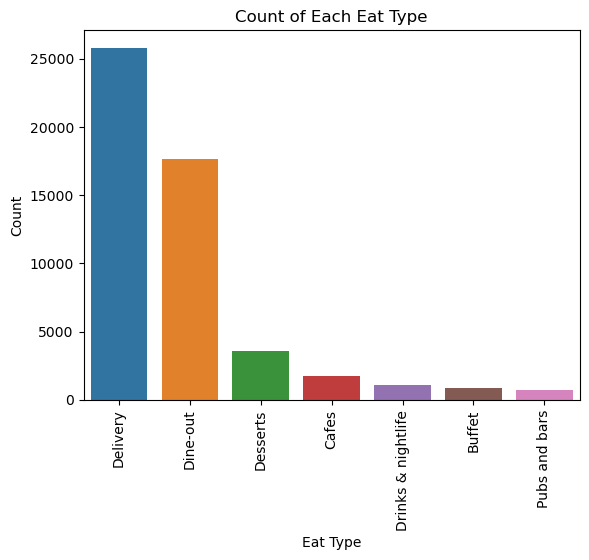

In [394]:
sns.barplot(x='Eat Type', y='Count', data=eat_type_counts)
plt.xlabel('Eat Type')
plt.ylabel('Count')
plt.title('Count of Each Eat Type')
plt.xticks(rotation=90)  
plt.show()


* The most popular eat type required in zomato website is delivery so we will focus our business case on this type 

## Location-Based Analysis:

* Are there specific neighborhoods where online orders are more popular?
* What is the most common restaurants in Bangauratta road neighborhood ?
* What is the distribution of restaurant types across different neighborhoods?
* Which neighborhood has highest no of restaurants with map visualization?

In [208]:
df1.columns

Index(['address', 'name', 'online_order', 'book_table', 'rate', 'votes',
       'city', 'rest_type', 'cuisines', 'approx_cost_2P', 'reviews_list',
       'eat_type', 'neighborhood'],
      dtype='object')

#### Are there specific neighborhoods where online orders are more popular?


In [209]:
result=df1.groupby('neighborhood')['online_order'].value_counts().unstack(fill_value=0)
result_sorted2 = result.sort_values(by='Yes', ascending=False)
result_sorted2

online_order,No,Yes
neighborhood,,
BTM,1146,2119
Koramangala 7th Block,1132,1795
Koramangala 4th Block,982,1786
Koramangala 5th Block,1055,1768
Koramangala 6th Block,951,1663
Jayanagar,781,1585
JP Nagar,750,1329
HSR,551,1183
Indiranagar,787,1064


<Axes: xlabel='neighborhood'>

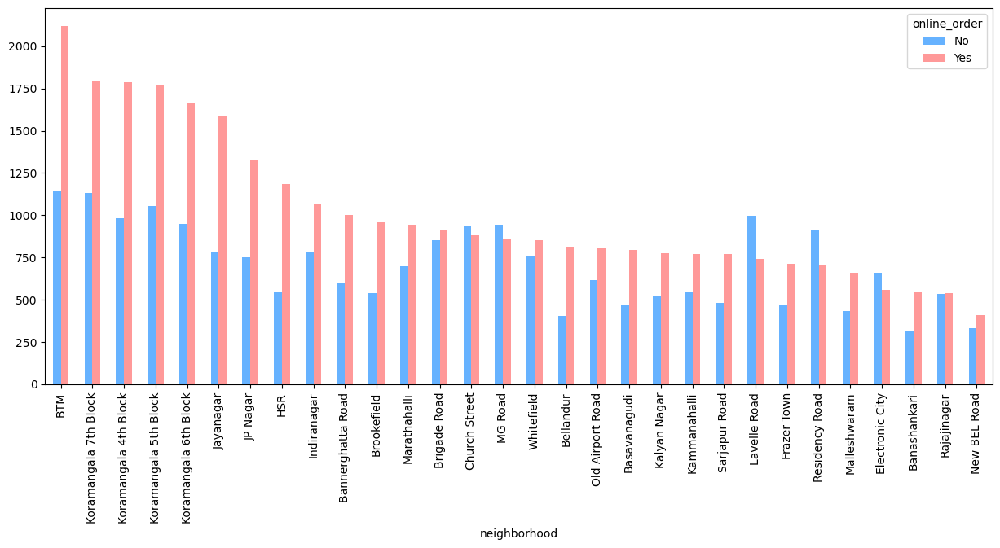

In [210]:
colors = ['#66B2FF', '#FF9999']
result_sorted2.plot(kind='bar', figsize=(15, 6), color=colors)


* BTM is the most popular neighborhood in terms of online order.

([<matplotlib.patches.Wedge at 0x1d1eb896010>,
 [Text(0.2707212028190245, 0.5354531075119656, 'BTM offline orders'),
  Text(-0.2707212529517615, -0.5354530821652149, 'BTM online orders')],
 [Text(0.5640025058729679, 1.115527307316595, '35.1%'),
  Text(-0.5640026103161698, -1.1155272545108643, '64.9%')])

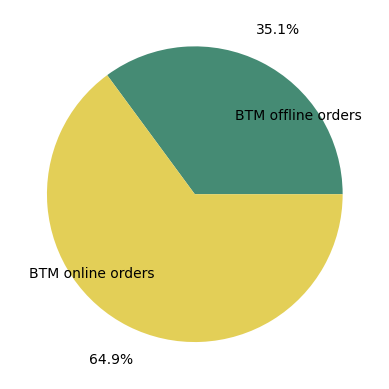

In [211]:
labels = 'BTM offline orders','BTM online orders'
sizes = [1146  , 2119]
colors = ['#458B74', '#E3CF57'] 
fig, ax = plt.subplots()
ax.pie(sizes, labels=labels, autopct='%1.1f%%',
       pctdistance=1.25, labeldistance=.6,colors=colors)

In [212]:
result=df2.groupby('neighborhood')['online_order'].value_counts().unstack(fill_value=0)
result_sorted = result.sort_values(by='Yes', ascending=False)
result_sorted

online_order,No,Yes
neighborhood,,
Bannerghatta Road,599,998
Bellandur,402,808
Basavanagudi,471,794
Banashankari,317,542
Brigade Road,73,43


<Axes: xlabel='neighborhood'>

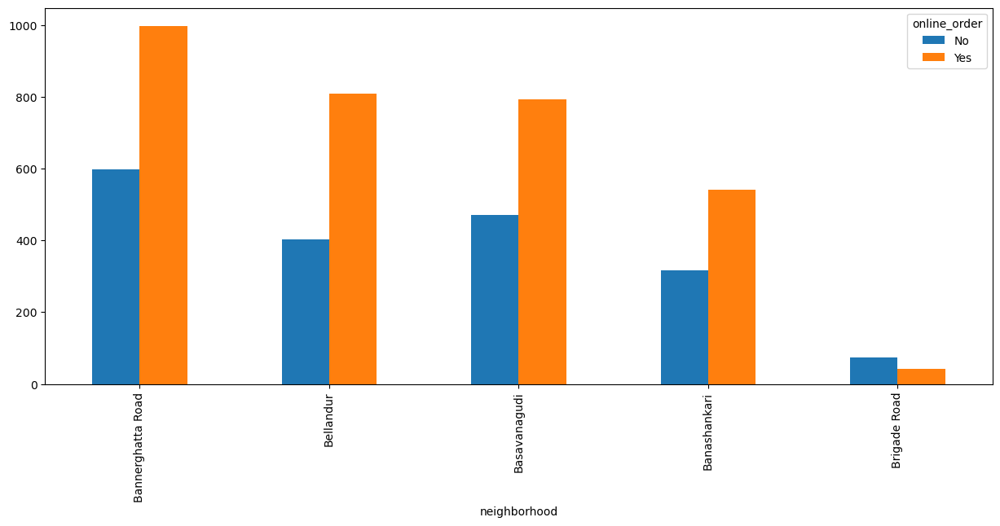

In [213]:
result_sorted.plot(kind='bar', figsize=(15,6))

* In the samples we take Bannerghatta Road is the popular in terms of online order.
* Let's visualize it on the map.

In [214]:
test = df2[(df2['city'] == 'Bannerghatta Road')]
test

,address,Latitude,Longitude,name,online_order,book_table,rate,votes,city,rest_type,cuisines,approx_cost_2P,eat_type,neighborhood
863,"128/54/10, First floor, Opposite IIM - B, Dasa...",12.895615,77.602547,Fattoush,Yes,Yes,4.2,1964,Bannerghatta Road,Casual Dining,"Arabian, Biryani, Chinese, Middle Eastern, Fas...",1000.0,Buffet,Bannerghatta Road
864,"4 & 5, Green Orchards Layout, 1st Cross, Banne...",12.929942,77.599137,Empire Restaurant,Yes,No,4.3,3178,Bannerghatta Road,Casual Dining,"North Indian, Mughlai, South Indian, Chinese",750.0,Buffet,Bannerghatta Road
865,"81/3, Opposite Royal Meenakshi Mall, Hulimavu,...",12.875700,77.595766,Abhiruchi Hotel,Yes,No,3.3,455,Bannerghatta Road,Casual Dining,"Andhra, Biryani, North Indian, Chinese",550.0,Buffet,Bannerghatta Road
866,"Tulips Resort & Amusement Park, 18th K.M, Bann...",12.839496,77.588870,Tulips,No,No,3.1,19,Bannerghatta Road,Casual Dining,"North Indian, South Indian, Chinese, Continental",800.0,Buffet,Bannerghatta Road
867,"67, 15th Cross, 6th B Main, JP Nagar, Bangalore",12.916184,77.556518,Barbeque Nation,No,Yes,4.7,3845,Bannerghatta Road,Casual Dining,"North Indian, European, Mediterranean, BBQ, Kebab",1600.0,Buffet,Bannerghatta Road
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2659,"24, Next to Roti Ghar, Gandhi Bazaar Main Road...",12.944856,77.571768,Cake Ghar,Yes,No,3.8,15,Bannerghatta Road,Bakery,Bakery,400.0,Delivery,Basavanagudi
2693,"2, Subramanyapura, Kadirenahalli Overbridge Ju...",12.914255,77.565342,Dakshin Grand,Yes,No,3.0,82,Bannerghatta Road,Quick Bites,"South Indian, North Indian, Chinese, Street Food",300.0,Delivery,Basavanagudi
2697,"603, Koramangala 8th Block, Bangalore",12.941469,77.617812,Ambur Biryani,Yes,No,3.6,0,Bannerghatta Road,Quick Bites,Biryani,200.0,Delivery,Basavanagudi
2890,"11/135, Chikkalakshmaiah Layout, Hosur Road, B...",12.853918,77.666075,New Punjabi Hotel,Yes,No,3.7,178,Bannerghatta Road,Quick Bites,"North Indian, Chinese",400.0,Delivery,Basavanagudi


In [215]:
df2.groupby('city')['online_order'].value_counts()

city                online_order
BTM                 Yes             233
                    No               56
Banashankari        Yes             397
                    No              365
Bannerghatta Road   Yes             436
                    No              322
Basavanagudi        Yes             325
                    No              186
Bellandur           Yes             370
                    No              244
HSR                 Yes              83
                    No                7
JP Nagar            Yes             381
                    No              213
Jayanagar           Yes             388
                    No              161
Kumaraswamy Layout  Yes              64
                    No                2
Marathahalli        Yes             107
                    No               32
Sarjapur Road       Yes             243
                    No              113
others              No              161
                    Yes             158
Name: o

In [216]:
test.Latitude.duplicated()

863     False
864     False
865     False
866     False
867     False
        ...  
2659    False
2693    False
2697    False
2890    False
3069    False
Name: Latitude, Length: 758, dtype: bool

In [217]:
test.drop_duplicates(subset='Latitude', keep='first', inplace=True)

In [218]:
import folium
# Create a map centered around the first location
m = folium.Map(location=[test['Latitude'].iloc[0], test['Longitude'].iloc[0]], zoom_start=12)

# Add markers for each restaurant using 'name' as label
for index, row in test.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['name'],
    ).add_to(m)

# Save the map to an HTML file
m.save('restaurant_map.html')

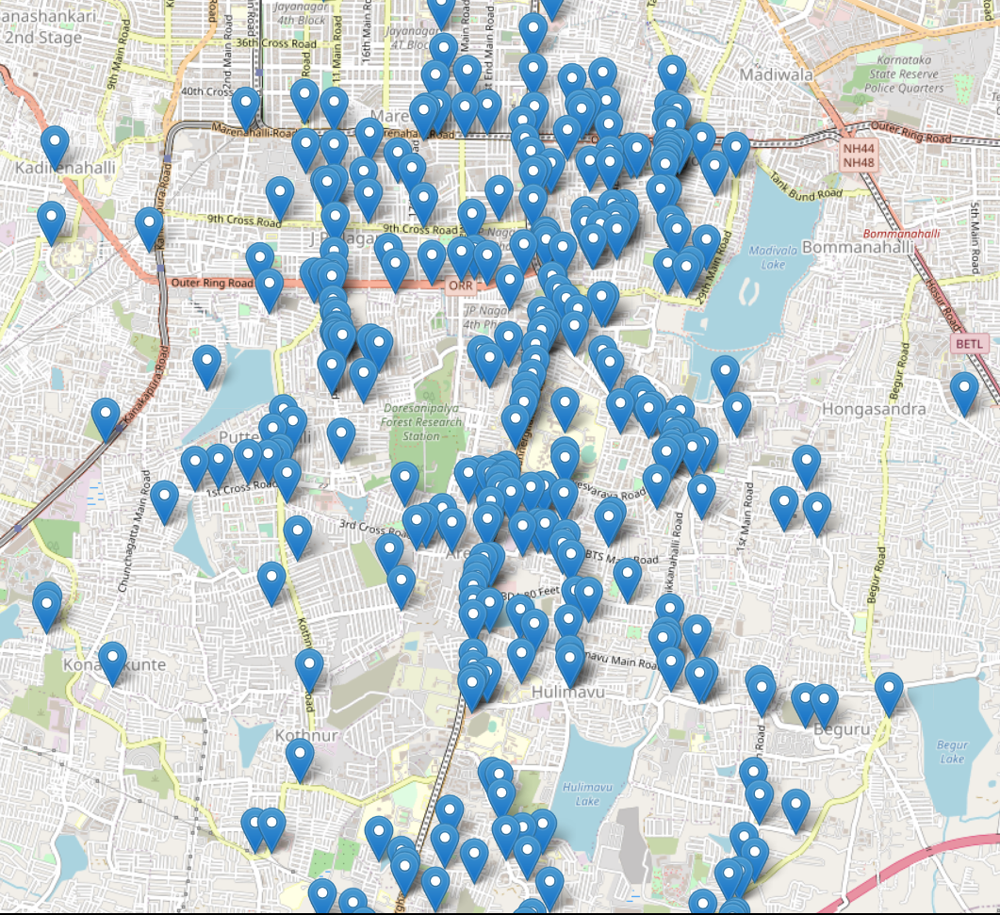

* Bannerghatta Road is one the highest region in online and offline ordering (highest restaurants)

In [219]:
test_2=df1[df1['neighborhood']=='BTM']

In [220]:
df1.neighborhood.value_counts()

BTM                      3265
Koramangala 7th Block    2927
Koramangala 5th Block    2823
Koramangala 4th Block    2768
Koramangala 6th Block    2614
Jayanagar                2366
JP Nagar                 2079
Indiranagar              1851
Church Street            1826
MG Road                  1807
Brigade Road             1767
Lavelle Road             1740
HSR                      1734
Marathahalli             1642
Residency Road           1617
Whitefield               1605
Bannerghatta Road        1603
Brookefield              1498
Old Airport Road         1416
Kammanahalli             1317
Kalyan Nagar             1299
Basavanagudi             1265
Sarjapur Road            1250
Electronic City          1219
Bellandur                1217
Frazer Town              1184
Malleshwaram             1094
Rajajinagar              1075
Banashankari              860
New BEL Road              738
Name: neighborhood, dtype: int64

In [221]:
test_2

,address,name,online_order,book_table,rate,votes,city,rest_type,cuisines,approx_cost_2P,reviews_list,eat_type,neighborhood
8260,"100 Feet Road, 1st Phase, Near Jayadeva Flyove...",AB's - Absolute Barbecues,No,Yes,4.9,6375,BTM,Casual Dining,others,1600.0,"[('Rated 5.0', 'RATED\n We liked the place a ...",Buffet,BTM
8261,"C K Emerald, Opposite Yes Bank, BTM Layout, Ba...",The Globe Grub,No,Yes,4.4,201,BTM,Casual Dining,others,1300.0,"[('Rated 4.0', 'RATED\n The globe grub the am...",Buffet,BTM
8262,"6, Krishna Nagar Industrial Area, Behind Forum...",Punjabi by Nature 2.0,Yes,Yes,4.2,3230,BTM,others,North Indian,1600.0,"[('Rated 3.0', ""RATED\n It has a beautiful am...",Buffet,BTM
8263,"5th Floor, CPR Tower, 100 Feet Ring Road, 1st ...","3B's - Buddies, Bar & Barbecues",No,Yes,4.4,1149,BTM,"Casual Dining, Bar",others,1100.0,"[('Rated 1.0', 'RATED\n Worst buffet dinner I...",Buffet,BTM
8264,"84, Hosur Main Road, Madivala, BTM, Bangalore",Savoury Restaurant,Yes,No,3.9,420,BTM,Casual Dining,others,800.0,"[('Rated 4.0', 'RATED\n my review 11th januar...",Buffet,BTM
...,...,...,...,...,...,...,...,...,...,...,...,...,...
11534,"3rd Floor, 100 Feet Road, Near BDA complex, Ko...",Barcode,No,Yes,3.8,169,others,others,"South Indian, North Indian",1300.0,"[('Rated 3.0', 'RATED\n First of all what kin...",Pubs and bars,BTM
11535,"Maruti Plaza, 340, 1st B Main Road, Koramangal...",Daawat Restaurant Bar & Pub,Yes,No,3.5,9,others,others,others,700.0,"[('Rated 5.0', 'RATED\n The place is very sma...",Pubs and bars,BTM
11536,"462, Opposite Fernhill Garden Apartments, Teac...",A Bar,No,No,3.3,19,HSR,others,"North Indian, Continental",600.0,"[('Rated 1.0', ""RATED\n Terrible decorum. Tom...",Pubs and bars,BTM
11537,"41-18/3 Laxman Layout, Opposite Royal County P...",Eagle Bar & Restaurant,No,No,3.0,0,JP Nagar,"Casual Dining, Bar","North Indian, Chinese",700.0,"[('Rated 3.0', ""RATED\n The rooftop is nice. ...",Pubs and bars,BTM


In [222]:
test_2.duplicated()

8260     False
8261     False
8262     False
8263     False
8264     False
         ...  
11534    False
11535    False
11536    False
11537    False
11538    False
Length: 3265, dtype: bool

In [223]:
name_counts = test_2['name'].value_counts().reset_index()
name_counts.columns = ['name', 'count']
name_counts

,name,count
0,Bun Town,6
1,Naati Manae,5
2,Sagar Fast Food,5
3,Deja Vu Resto Bar,5
4,Sri Lakshmi Dhaba,4
...,...,...
2015,Purnabramha Maharashtrian Restaurant,1
2016,Taste of Assam,1
2017,Marahaba,1
2018,Foreign CafÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂ©,1


* more users go for them so they are common 

#### What is the most common restaurants in Bangauratta road neighborhood ?


In [224]:
import plotly.graph_objects as go

# Define the data
y_data = ['Bun Town', 'Naati Manae', 'Sri Lakshmi Dhaba']
x_data = [6, 5, 4]
custom_colors = ['#00008B', '#4169E1', '#3366FF']  # Replace with your desired colors

# Create the horizontal bar chart
fig = go.Figure(go.Bar(
    x=x_data,
    y=y_data,
    orientation='h',
    marker=dict(
        color=custom_colors  # Assign the custom colors to the bars
    )
))

# Customize the layout if needed
fig.update_layout(
    title='Custom Colored Horizontal Bar Chart',
    xaxis_title='Values',
    yaxis_title='Categories'
)

fig.show()


* buntown(bakery cuisine), naati manee(north indian) and sri lakshmi dhaba(soth indain) are the most common in BTM


* these 3 restaurants ranges from 150 to 600 according to different locations.

In [225]:
df1[df1['name']=='Bun Town']

,address,name,online_order,book_table,rate,votes,city,rest_type,cuisines,approx_cost_2P,reviews_list,eat_type,neighborhood
1282,"458, 2nd Main Road, Mico Layout, Stage 1, BTM,...",Bun Town,Yes,No,4.0,203,BTM,others,"Cafe, Bakery",500.0,"[('Rated 4.0', 'RATED\n Very nice decorative ...",Delivery,Bannerghatta Road
8305,"458, 2nd Main Road, Mico Layout, Stage 1, BTM,...",Bun Town,Yes,No,4.0,204,BTM,others,"Cafe, Bakery",500.0,"[('Rated 4.0', 'RATED\n Very nice decorative ...",Cafes,BTM
8381,"3, 60 Feet Road, 1st Cross Road, Koramangala 5...",Bun Town,Yes,No,3.8,22,others,Cafe,"Cafe, Bakery",500.0,"[('Rated 4.0', 'RATED\n The only place In ban...",Cafes,BTM
8931,"458, 2nd Main Road, Mico Layout, Stage 1, BTM,...",Bun Town,Yes,No,4.0,204,BTM,others,"Cafe, Bakery",500.0,"[('Rated 4.0', 'RATED\n Very nice decorative ...",Delivery,BTM
9563,"3, 60 Feet Road, 1st Cross Road, Koramangala 5...",Bun Town,Yes,No,3.8,22,others,Cafe,"Cafe, Bakery",500.0,"[('Rated 4.0', 'RATED\n The only place In ban...",Delivery,BTM
10219,"458, 2nd Main Road, Mico Layout, Stage 1, BTM,...",Bun Town,Yes,No,4.0,207,BTM,others,"Cafe, Bakery",500.0,"[('Rated 4.0', 'RATED\n Very nice decorative ...",Desserts,BTM
11162,"3, 60 Feet Road, 1st Cross Road, Koramangala 5...",Bun Town,Yes,No,3.8,22,others,Cafe,"Cafe, Bakery",500.0,"[('Rated 4.0', 'RATED\n The only place In ban...",Dine-out,BTM
19461,"458, 2nd Main Road, Mico Layout, Stage 1, BTM,...",Bun Town,Yes,No,4.0,204,BTM,others,"Cafe, Bakery",500.0,"[('Rated 4.0', 'RATED\n Very nice decorative ...",Cafes,Jayanagar
19869,"458, 2nd Main Road, Mico Layout, Stage 1, BTM,...",Bun Town,Yes,No,4.0,204,BTM,others,"Cafe, Bakery",500.0,"[('Rated 4.0', 'RATED\n Very nice decorative ...",Delivery,Jayanagar
20498,"3, 60 Feet Road, 1st Cross Road, Koramangala 5...",Bun Town,Yes,No,3.8,22,others,Cafe,"Cafe, Bakery",500.0,"[('Rated 4.0', 'RATED\n The only place In ban...",Delivery,Jayanagar


In [226]:
df1[df1['name']=='Naati Manae']

,address,name,online_order,book_table,rate,votes,city,rest_type,cuisines,approx_cost_2P,reviews_list,eat_type,neighborhood
1207,"4th Floor, Bangalore Central Mall, 9th Block, ...",Naati Manae,Yes,No,3.1,10,JP Nagar,others,"South Indian, Biryani",500.0,"[('Rated 1.0', ""RATED\n Not worth the price. ...",Delivery,Bannerghatta Road
2760,"4th Floor, Bangalore Central Mall, 9th Block, ...",Naati Manae,Yes,No,3.1,10,JP Nagar,others,"South Indian, Biryani",500.0,"[('Rated 1.0', ""RATED\n Not worth the price. ...",Delivery,Basavanagudi
8286,"462, 1st Floor, 17th C Main Road, 2nd Cross, K...",Naati Manae,Yes,Yes,3.9,484,others,Casual Dining,others,700.0,"[('Rated 4.0', ""RATED\n I have had donne biry...",Buffet,BTM
8660,"462, 1st Floor, 17th C Main Road, 2nd Cross, K...",Naati Manae,Yes,Yes,3.9,484,others,Casual Dining,others,700.0,"[('Rated 4.0', ""RATED\n I have had donne biry...",Delivery,BTM
8719,"4th Floor, Bangalore Central Mall, 9th Block, ...",Naati Manae,Yes,No,3.1,10,JP Nagar,others,"South Indian, Biryani",500.0,"[('Rated 1.0', ""RATED\n Not worth the price. ...",Delivery,BTM
10964,"462, 1st Floor, 17th C Main Road, 2nd Cross, K...",Naati Manae,Yes,Yes,3.9,484,others,Casual Dining,others,700.0,"[('Rated 4.0', ""RATED\n I have had donne biry...",Dine-out,BTM
11218,"4th Floor, Bangalore Central Mall, 9th Block, ...",Naati Manae,Yes,No,3.1,10,JP Nagar,others,"South Indian, Biryani",500.0,"[('Rated 1.0', ""RATED\n Not worth the price. ...",Dine-out,BTM
19937,"4th Floor, Bangalore Central Mall, 9th Block, ...",Naati Manae,Yes,No,3.1,10,JP Nagar,others,"South Indian, Biryani",500.0,"[('Rated 1.0', ""RATED\n Not worth the price. ...",Delivery,Jayanagar
20473,"462, 1st Floor, 17th C Main Road, 2nd Cross, K...",Naati Manae,Yes,Yes,3.9,484,others,Casual Dining,others,700.0,"[('Rated 4.0', ""RATED\n I have had donne biry...",Delivery,Jayanagar
21499,"4th Floor, Bangalore Central Mall, 9th Block, ...",Naati Manae,Yes,No,3.1,10,JP Nagar,others,"South Indian, Biryani",500.0,"[('Rated 1.0', ""RATED\n Not worth the price. ...",Dine-out,Jayanagar


#### What is the distribution of restaurant types across different neighborhoods?

In [227]:
df1.columns

Index(['address', 'name', 'online_order', 'book_table', 'rate', 'votes',
       'city', 'rest_type', 'cuisines', 'approx_cost_2P', 'reviews_list',
       'eat_type', 'neighborhood'],
      dtype='object')

In [228]:
unique_res_types = df1['rest_type'].unique()
unique_res_types

array(['Casual Dining', 'others', 'Quick Bites', 'Cafe', 'Delivery',
       'Dessert Parlor', 'Bakery', 'Takeaway, Delivery',
       'Casual Dining, Bar'], dtype=object)

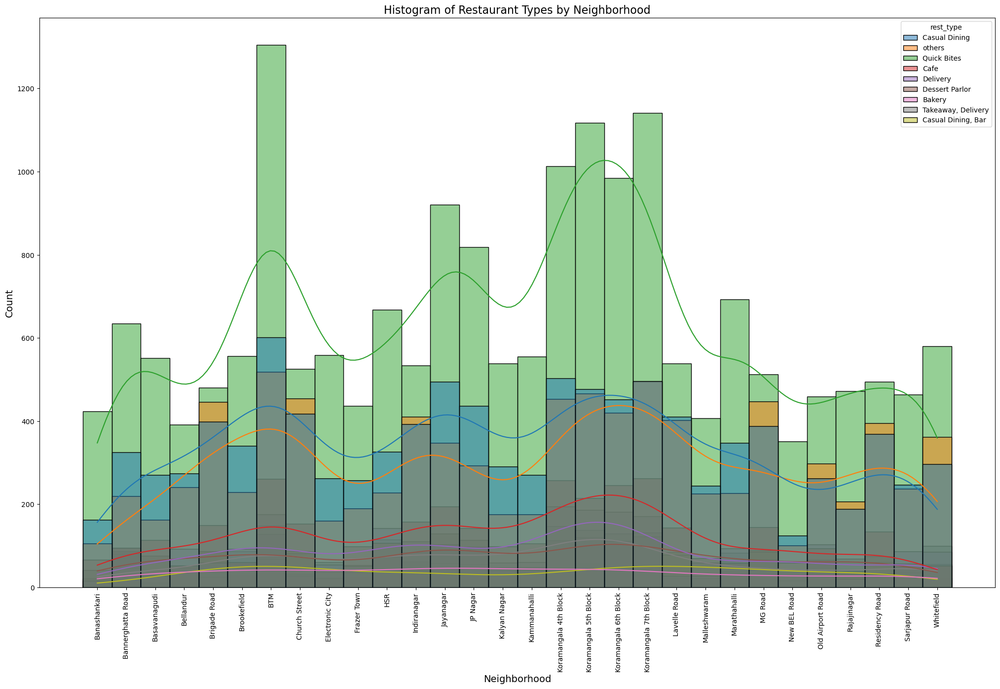

In [229]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(25, 15))
sns.histplot(data=df1, x='neighborhood', hue='rest_type', kde=True )
plt.xlabel('Neighborhood', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Histogram of Restaurant Types by Neighborhood', fontsize=16)
plt.xticks(rotation=90)


plt.show()


* As we can see that quick byte restaurants are the most popular in all neighborhoods , then casual dining but it disappears from specific neigborhoods, this reflects very important culture behaviour as bangalore tends to quick serving type of food.

In [230]:
locate_cafe=df1[df1['eat_type']=='Cafes']
locate_cafe

,address,name,online_order,book_table,rate,votes,city,rest_type,cuisines,approx_cost_2P,reviews_list,eat_type,neighborhood
7,"2469, 3rd Floor, 24th Cross, Opposite BDA Comp...",Onesta,Yes,Yes,4.6,2556,Banashankari,others,others,600.0,"[('Rated 5.0', 'RATED\n I personally really l...",Cafes,Banashankari
8,"1, 30th Main Road, 3rd Stage, Banashankari, Ba...",Penthouse Cafe,Yes,No,4.0,324,Banashankari,Cafe,others,700.0,"[('Rated 3.0', ""RATED\n I had been to this pl...",Cafes,Banashankari
9,"2470, 21 Main Road, 25th Cross, Banashankari, ...",Smacznego,Yes,No,4.2,504,Banashankari,Cafe,others,550.0,"[('Rated 4.0', ""RATED\n Easy to locate\nVFM 3...",Cafes,Banashankari
10,"12,29 Near PES University Back Gate, D'Souza N...",CafÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂ© Down The A...,Yes,No,4.1,402,Banashankari,Cafe,Cafe,500.0,"[('Rated 4.0', 'RATED\n We ended up here on a...",Cafes,Banashankari
11,"941, 3rd FLOOR, 21st Main, 22nd Cross, Banasha...",Cafe Shuffle,Yes,Yes,4.2,150,Banashankari,Cafe,others,600.0,"[('Rated 1.0', ""RATED\n \n\nHorrible. Not even...",Cafes,Banashankari
...,...,...,...,...,...,...,...,...,...,...,...,...,...
50130,"Food Court, Ascendas Park Square Mall, ITPL Ma...",Beaten Coffee,No,No,3.7,0,others,others,others,200.0,[],Cafes,Whitefield
50131,"Ground Floor, Phoenix Market City Mall, Mahade...",The Coffee Bean & Tea Leaf,Yes,No,3.0,38,others,Cafe,others,700.0,"[('Rated 5.0', ""RATED\n The best proper Ameri...",Cafes,Whitefield
50132,"Santosh Towers EPIP Zone, Near KTPO, ITPL Main...",Cafe Thulp,Yes,No,3.6,57,"ITPL Main Road, Whitefield",Cafe,others,1000.0,"[('Rated 4.0', 'RATED\n Wonderful Experience ...",Cafes,Whitefield
50133,"SST Brindavan,No.65,EPIP, Whitefield, opposite...",Chaai Resto,Yes,No,3.5,8,Brookefield,Cafe,others,200.0,"[('Rated 5.0', 'RATED\n "" a cup of tea is an ...",Cafes,Whitefield


In [231]:
neighborhood_counts = locate_cafe['neighborhood'].value_counts().reset_index()
neighborhood_counts.columns = ['Neighborhood', 'Count']
neighborhood_counts = neighborhood_counts.sort_values(by='Count', ascending=False)
# Create a gradient color palette
n_colors = len(neighborhood_counts)
palette = sns.color_palette("viridis", n_colors)


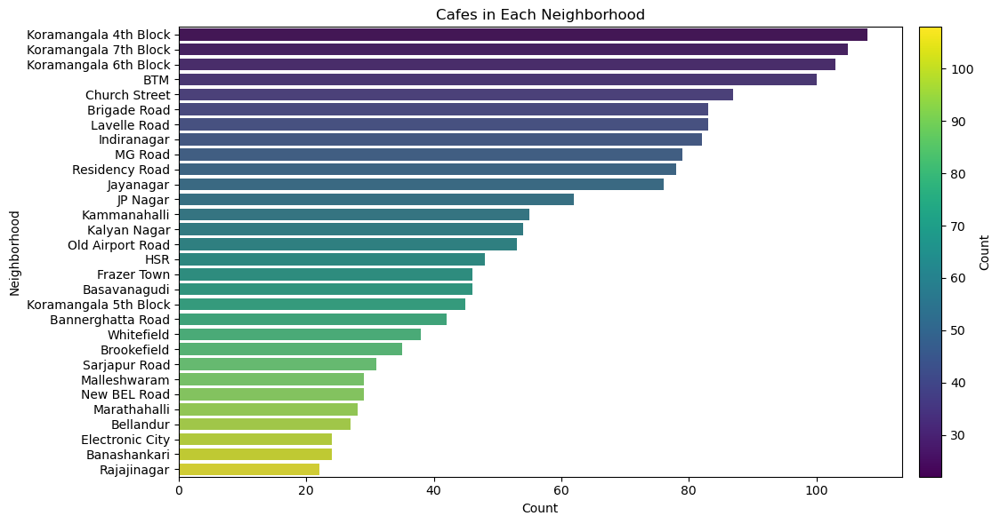

In [232]:
# Create a figure and axis
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='Count', y='Neighborhood', data=neighborhood_counts, palette=palette)

# Set labels and title
ax.set_xlabel('Count')
ax.set_ylabel('Neighborhood')
ax.set_title('Cafes in Each Neighborhood')

# Show the color bar for the gradient
sm = plt.cm.ScalarMappable(cmap="viridis", norm=plt.Normalize(vmin=neighborhood_counts['Count'].min(), vmax=neighborhood_counts['Count'].max()))
sm.set_array([])  # This line is necessary for the color bar to work correctly
cbar = plt.colorbar(sm, orientation='vertical', ax=ax, pad=0.02)
cbar.set_label('Count')

# Show the plot
plt.tight_layout()
plt.show()


* according to our search , koramangala 4th block is the best in south bangalore to see friends and besides its place where most  

In [233]:
locate_cafe=df2[df2['eat_type']=='Cafes']
locate_cafe

,address,Latitude,Longitude,name,online_order,book_table,rate,votes,city,rest_type,cuisines,approx_cost_2P,eat_type,neighborhood
6,"2469, 3rd Floor, 24th Cross, Opposite BDA Comp...",12.923116,77.572567,Onesta,Yes,Yes,4.6,2556,others,others,"Pizza, Cafe, Italian",600.0,Cafes,Banashankari
7,"1, 30th Main Road, 3rd Stage, Banashankari, Ba...",12.925815,77.560692,Penthouse Cafe,Yes,No,4.0,324,Banashankari,Cafe,"Cafe, Italian, Continental",700.0,Cafes,Banashankari
8,"2470, 21 Main Road, 25th Cross, Banashankari, ...",12.924014,77.564063,Smacznego,Yes,No,4.2,504,Banashankari,Cafe,"Cafe, Mexican, Italian, Momos, Beverages",550.0,Cafes,Banashankari
9,"12,29 Near PES University Back Gate, D'Souza N...",12.935380,77.535825,CafÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂ© Down The A...,Yes,No,4.1,402,Banashankari,Cafe,Cafe,500.0,Cafes,Banashankari
10,"941, 3rd FLOOR, 21st Main, 22nd Cross, Banasha...",12.925572,77.564860,Cafe Shuffle,Yes,Yes,4.2,150,Banashankari,Cafe,"Cafe, Italian, Continental",600.0,Cafes,Banashankari
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5085,"The Ambara, 22, Annaswami Mudaliar Road, Near ...",12.984001,77.617386,Cafe Cerrise,No,No,3.8,99,others,Cafe,"Cafe, Continental, Salad",600.0,Cafes,Brigade Road
5086,Church Street,12.974364,77.607734,Rasta,No,No,3.6,0,others,others,"Continental, Cafe",1000.0,Cafes,Brigade Road
5087,"Lal Bagh Main Road, Sampangi Rama Nagar, Near ...",12.958772,77.586607,Bread and Circus,Yes,No,3.7,50,others,Cafe,"Cafe, Fast Food, Pizza, Burger",550.0,Cafes,Brigade Road
5088,"23, HKP Road Broadway",12.988790,77.602453,Savera Cafe,No,No,3.7,11,others,Cafe,Cafe,50.0,Cafes,Brigade Road


In [234]:
locate_cafe['neighborhood'].value_counts()

Brigade Road         59
Basavanagudi         46
Bannerghatta Road    42
Bellandur            27
Banashankari         24
Name: neighborhood, dtype: int64

* The most popular place to open cafe is Brigade Road

In [235]:
import folium
import os 
# Create a map centered around the first location
m = folium.Map(location=[locate_cafe['Latitude'].iloc[0], locate_cafe['Longitude'].iloc[0]], zoom_start=12)

# Add markers for each restaurant using 'name' as label
for index, row in locate_cafe.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['name'],
    ).add_to(m)

# Save the map to an HTML file
m.save('restaurant_map.html')
current_directory = os.getcwd()
print("Current working directory:", current_directory)


Current working directory: C:\Users\MBR


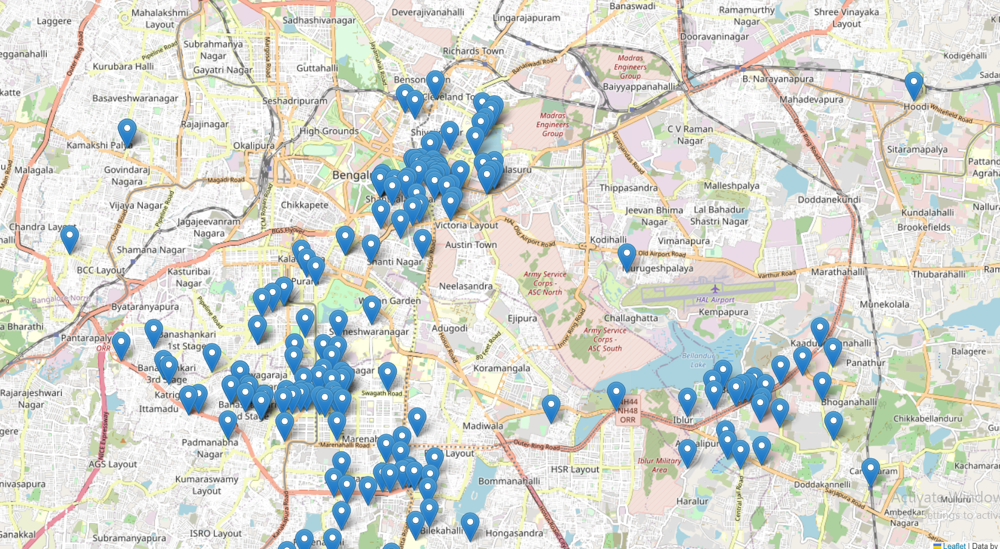

* Distribution of Restaurant in which the main service is CAFE

In [236]:
locate_res_high_rate=df2[df2['rate']>4.5]
locate_res_high_rate

,address,Latitude,Longitude,name,online_order,book_table,rate,votes,city,rest_type,cuisines,approx_cost_2P,eat_type,neighborhood
6,"2469, 3rd Floor, 24th Cross, Opposite BDA Comp...",12.923116,77.572567,Onesta,Yes,Yes,4.6,2556,others,others,"Pizza, Cafe, Italian",600.0,Cafes,Banashankari
43,"2469, 3rd Floor, 24th Cross, Opposite BDA Comp...",12.923116,77.572567,Onesta,Yes,Yes,4.6,2556,Banashankari,others,"Pizza, Cafe, Italian",600.0,Delivery,Banashankari
115,"3148, 2nd Cross, 4th Phase Girinagar, Near Hos...",12.934793,77.545639,Wood Stove,No,No,5.0,0,Banashankari,"Takeaway, Delivery",South Indian,150.0,Delivery,Banashankari
133,"487, Cauvery Complex, S.B.M Colony, 80 Feet Ro...",12.940846,77.542703,Kaumudis Juoice,No,No,5.0,0,Banashankari,others,"Beverages, Fast Food, Juices",150.0,Delivery,Banashankari
163,"615/1, Ground Floor, Janardhan Mansion, 10th C...",12.927229,77.585803,The Blue Wagon - Kitchen,Yes,No,4.6,228,Basavanagudi,Cafe,"Cafe, Beverages",400.0,Delivery,Banashankari
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4962,"20/7, Swamy Legato, Outer Ring Road, Kadubeesa...",12.937844,77.693855,The Black Pearl,No,Yes,4.8,7023,Bellandur,"Casual Dining, Bar","North Indian, European, Mediterranean, BBQ",1500.0,Pubs and bars,Bellandur
4965,"22, 57/58/1/2, Saket Callipolis, Doddakannhall...",12.909907,77.685871,Sarjapur Social,Yes,No,4.6,1193,Sarjapur Road,others,"American, North Indian, Chinese, Finger Food",1500.0,Pubs and bars,Bellandur
4969,"26, Varthur Hobli, Near HP Petrol Bunk, Harlur...",12.911622,77.664190,Opus Food Stories,No,Yes,4.7,163,Marathahalli,others,"Goan, Asian, North Indian, European, Continental",1500.0,Pubs and bars,Bellandur
4982,"The Oberoi, 37-39, MG Road, Bangalore",12.973605,77.618403,Rim Naam - The Oberoi,No,No,4.6,979,others,others,Thai,3000.0,Buffet,Brigade Road


In [237]:
import folium
import os 
# Create a map centered around the first location
m = folium.Map(location=[locate_res_high_rate['Latitude'].iloc[0], locate_res_high_rate['Longitude'].iloc[0]], zoom_start=12)

# Add markers for each restaurant using 'name' as label
for index, row in locate_res_high_rate.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['name'],
    ).add_to(m)

# Save the map to an HTML file
m.save('restaurant_map.html')
current_directory = os.getcwd()
print("Current working directory:", current_directory)

Current working directory: C:\Users\MBR


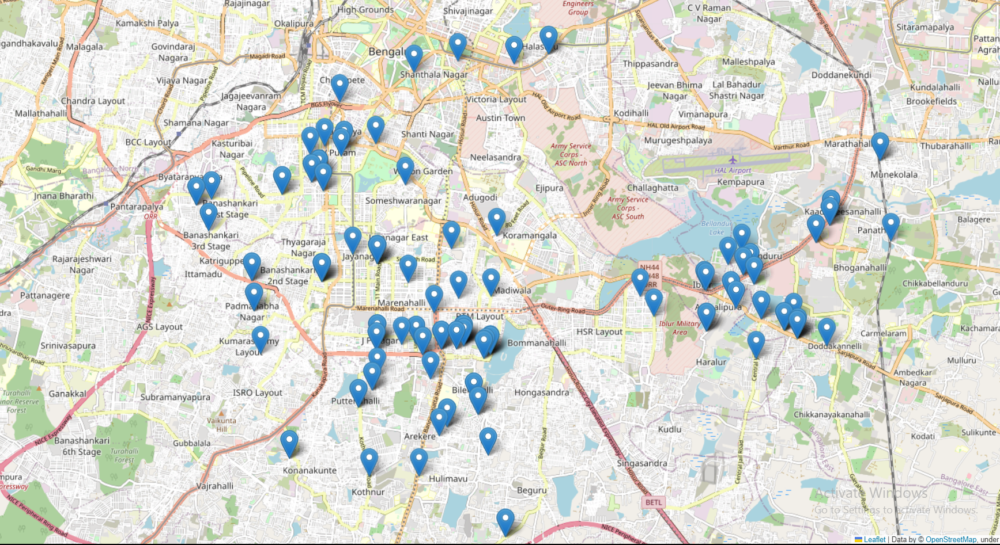

* The distribution of high rate restaurants in bangalore

## Cuisine Analysis:
* What are the most popular cuisines in our use case?
* Do certain cuisines receive higher ratings on average?
* Are there any neighborhoods known for specific types of cuisines?

 #### What are the most popular cuisines in our use case?

In [397]:
df1.columns

Index(['address', 'name', 'online_order', 'book_table', 'rate', 'votes',
       'city', 'rest_type', 'cuisines', 'approx_cost_2P', 'reviews_list',
       'eat_type', 'neighborhood'],
      dtype='object')

In [398]:
df1[df1['cuisines']== 'North Indian']

,address,name,online_order,book_table,rate,votes,city,rest_type,cuisines,approx_cost_2P,reviews_list,eat_type,neighborhood
5,"37, 5-1, 4th Floor, Bosco Court, Gandhi Bazaar...",Timepass Dinner,Yes,No,3.8,286,Basavanagudi,Casual Dining,North Indian,600.0,"[('Rated 3.0', 'RATED\n Food 3/5\nAmbience 3/...",Buffet,Banashankari
50,"276, Ground Floor, 100 Feet Outer Ring Road, B...",Petoo,No,No,3.7,21,Banashankari,Quick Bites,North Indian,450.0,"[('Rated 2.0', 'RATED\n This is a neatly made...",Delivery,Banashankari
72,"Opposite ICICi Bank, Hanuman Nagar, Banashanka...",Spicy Tandoor,No,No,4.5,0,Banashankari,Quick Bites,North Indian,150.0,"[('Rated 4.0', 'RATED\n cost for chicken roll...",Delivery,Banashankari
87,"38, 22nd Main, 22nd Cross, Opposite BDA, 2nd S...",Krishna Sagar,No,No,3.5,31,Banashankari,Quick Bites,North Indian,200.0,"[('Rated 1.0', 'RATED\n Worst experience with...",Delivery,Banashankari
94,"304, Opposite Apollo Public School, 100 Feet R...",Nandhini Deluxe,No,No,2.6,283,Banashankari,Casual Dining,North Indian,600.0,"[('Rated 3.0', 'RATED\n Ididnt like much.\n\n...",Delivery,Banashankari
...,...,...,...,...,...,...,...,...,...,...,...,...,...
51622,"Pattandur Agrahara, ITPL Main Road, Whitefield...",Khane Ka Khazana,Yes,No,3.5,17,"ITPL Main Road, Whitefield",Quick Bites,North Indian,250.0,"[('Rated 3.0', 'RATED\n Decent food at cheap ...",Dine-out,Whitefield
51626,"Plot 107, Praveen Transport Complex, Near ITPL...",Ghar Ke Phulke,No,No,5.0,0,"ITPL Main Road, Whitefield",Quick Bites,North Indian,300.0,"[('Rated 5.0', 'RATED\n Awesome food, amazing...",Dine-out,Whitefield
51627,"Near MVJ College, Channasandra Main Road, Oppo...",New Shalimar Hotel,No,No,3.7,0,"ITPL Main Road, Whitefield",Quick Bites,North Indian,300.0,[],Dine-out,Whitefield
51631,"316 B Block, ACES Layout, 4th Main Road, Brook...",Just Parathas,No,No,3.4,5,Brookefield,Quick Bites,North Indian,250.0,"[('Rated 5.0', 'RATED\n Had the paneer parant...",Dine-out,Whitefield


In [399]:
most_popular = df1['cuisines'].value_counts().reset_index()
most_popular.columns = ['cuisines', 'count']
most_popular


,cuisines,count
0,others,26362
1,North Indian,2899
2,"North Indian, Chinese",2361
3,South Indian,1828
4,Biryani,909
...,...,...
65,"South Indian, Chinese, North Indian",105
66,"North Indian, Mughlai, Chinese",104
67,"South Indian, Fast Food",104
68,"Italian, Pizza",102


In [400]:
X=most_popular[most_popular['count']>800]

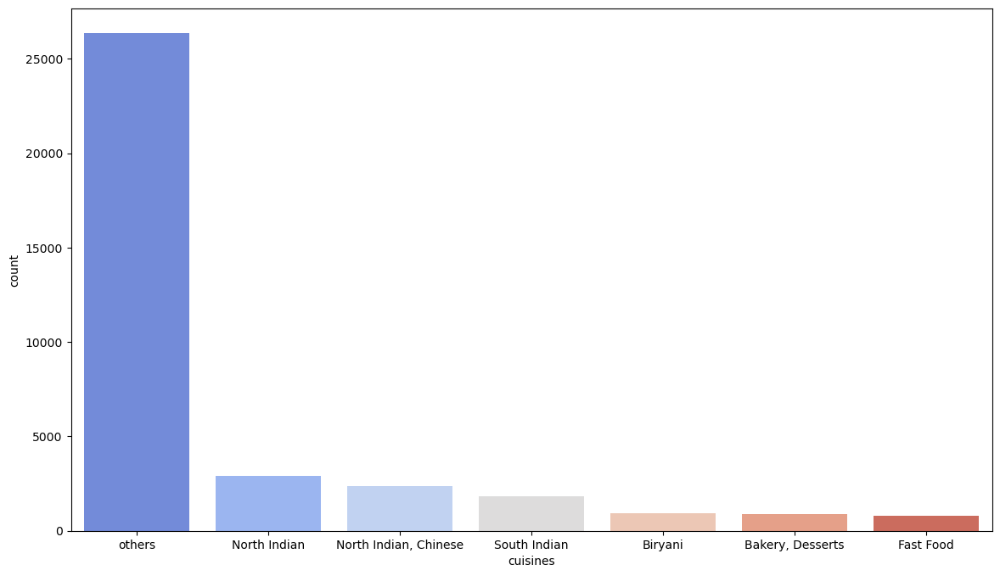

In [401]:
plt.figure(figsize=(14,8))
sns.barplot(x= 'cuisines',y='count' ,data = X ,palette='coolwarm'  )
plt.show()

* This 5 cuinsines are most popular in india according to zomato website and according to the no of vistors and restaurants that offer that 

#### Do certain cuisines receive higher ratings on average?


In [243]:
count_by_cuisine = df1[df1['rate'] > 4.5].groupby('cuisines').size()
count_by_cuisine.sort_values(ascending=False)


cuisines
others                                 1028
North Indian                             97
Bakery, Desserts                         56
South Indian                             54
Desserts                                 40
Fast Food                                39
North Indian, Chinese                    39
Bakery                                   36
North Indian, Chinese, Biryani           22
Chinese                                  22
Beverages, Desserts                      18
Chinese, North Indian                    17
Biryani                                  17
South Indian, North Indian               16
North Indian, South Indian               15
Ice Cream, Desserts                      15
Mithai, Street Food                      13
Beverages                                13
North Indian, Fast Food                  12
Desserts, Beverages                      12
Arabian                                  12
South Indian, Biryani                    11
Andhra, Biryani        

* As illustreted from the previous questions that the most popular five Cuisines are north indain , this question also illustrates that these are taking large number of rates higher than 4.5. this illustrates more their popularity.

#### Are there any neighborhoods known for specific types of cuisines?


In [402]:
df1.columns

Index(['address', 'name', 'online_order', 'book_table', 'rate', 'votes',
       'city', 'rest_type', 'cuisines', 'approx_cost_2P', 'reviews_list',
       'eat_type', 'neighborhood'],
      dtype='object')

In [404]:
df_test=df1[df1['neighborhood']=='BTM']
df_test.cuisines.value_counts()

others                            1723
North Indian                       195
North Indian, Chinese              174
South Indian                        70
Fast Food                           60
                                  ... 
Burger, Fast Food                    4
Desserts, Bakery                     4
Pizza, Fast Food                     4
South Indian, Fast Food              3
North Indian, Mughlai, Chinese       1
Name: cuisines, Length: 70, dtype: int64

* BTM is known by north indian. chinese , southindian and fastfood.

In [405]:
df_test=df1[df1['neighborhood']=='Koramangala 7th Block']

In [406]:
df_test.cuisines.value_counts()

others                                 1583
North Indian                            179
North Indian, Chinese                   141
South Indian                             66
Biryani                                  55
                                       ... 
Burger, Fast Food                         4
Pizza, Fast Food                          4
South Indian, Chinese, North Indian       4
South Indian, Fast Food                   2
North Indian, Continental                 2
Name: cuisines, Length: 70, dtype: int64

same as above except biryani is popular too

# Pricing and Cost Analysis:
* How does the average cost for two people vary across different types of restaurants?
* Is there a correlation between the cost and the restaurant's rating or popularity?
* is there any neighborhood famous by high cost restaurants?

#### How does the average cost for two people vary across different types of restaurants?

In [407]:
df1.columns

Index(['address', 'name', 'online_order', 'book_table', 'rate', 'votes',
       'city', 'rest_type', 'cuisines', 'approx_cost_2P', 'reviews_list',
       'eat_type', 'neighborhood'],
      dtype='object')

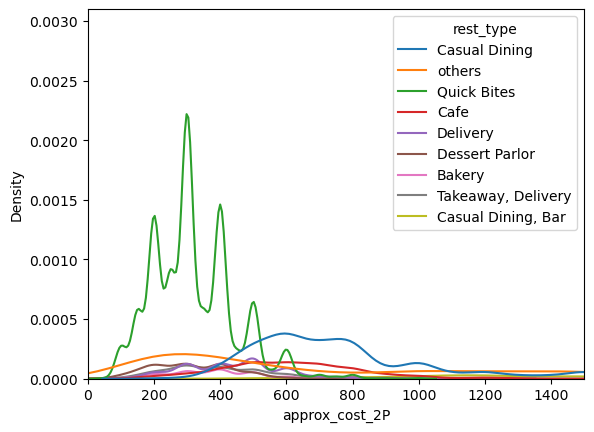

In [408]:
sns.kdeplot(data=df1, x="approx_cost_2P", hue="rest_type")

plt.xlim(0, 1500)  # Replace 0 and 2000 with your desired x-axis limits
plt.ylim(0, 0.0031)  # Replace 0 and 0.03 with your desired y-axis limits

# Show the plot
plt.show()


* Distribution of price among different restaurant types. and the others then casual dining vary the most in price. but need more clear visual
* vary from 150 to 1500 most probably

<Axes: xlabel='approx_cost_2P', ylabel='rest_type'>

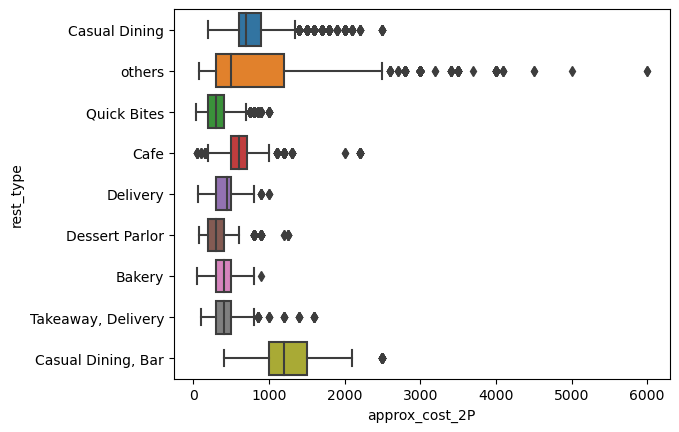

In [409]:
sns.boxplot(data=df1, x="approx_cost_2P", y="rest_type")


* cost vary from 150 to approx. of 1500 and the rest seems to be outliers .

#### Is there a correlation between the cost and the restaurant's rating


In [410]:
df_correlate_2=df1[['approx_cost_2P','rate']]

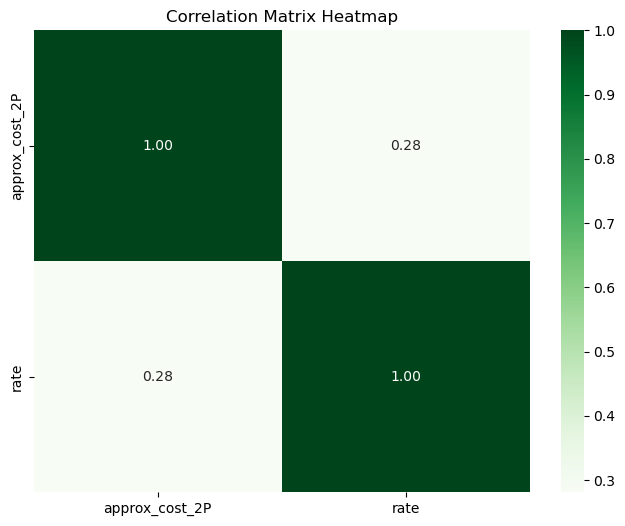

In [411]:
correlation_matrix = df_correlate_2.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='Greens', fmt=".2f")
plt.title("Correlation Matrix Heatmap")
plt.show()

* there exists week positive correlation between them

In [416]:
test_price=df1[df1['approx_cost_2P']>800]

In [417]:
test_price

,address,name,online_order,book_table,rate,votes,city,rest_type,cuisines,approx_cost_2P,reviews_list,eat_type,neighborhood
22,"SRF Complex, Near BDA Complex, Kathreguppe Mai...",Cafe Coffee Day,No,No,3.6,28,Banashankari,Cafe,"Cafe, Fast Food",900.0,"[('Rated 4.0', 'RATED\n This outlet is better...",Cafes,Banashankari
48,"179, 1st Floor, Jawarlalnehru Road, BEML Layou...",Beijing Bites,Yes,No,3.7,679,others,Casual Dining,"Chinese, Thai",850.0,"[('Rated 3.0', 'RATED\n IÃ\x83Ã\x83Ã\x82Ã...",Delivery,Banashankari
63,"296, Ram Towers, 100 Feet Ring Road, Banashank...",1947,No,Yes,4.0,808,Banashankari,Casual Dining,"North Indian, Chinese",850.0,"[('Rated 4.0', 'RATED\n Excellent food I had ...",Delivery,Banashankari
67,"10, 30th Main, Deve Gowda Petrol Bunk Road, 3r...",Gustoes Beer House,No,No,4.1,868,Banashankari,others,others,1200.0,"[('Rated 5.0', 'RATED\n Has a really calm roo...",Delivery,Banashankari
97,"34, 22nd Main, 22nd Cross, Opposite BDA, 2nd S...",Ayda Persian Kitchen,No,No,3.7,39,Banashankari,Casual Dining,others,950.0,"[('Rated 1.0', 'RATED\n The quality of foods ...",Delivery,Banashankari
...,...,...,...,...,...,...,...,...,...,...,...,...,...
51710,"2E2, 4th Cross Road, Devasandra Industrial Est...",Topsy Turvey,No,No,4.0,0,others,others,Finger Food,900.0,"[('Rated 4.0', ""RATED\n A divine joint for Fl...",Pubs and bars,Whitefield
51712,"Four Points by Sheraton Bengaluru, 43/3, White...",Best Brews - Four Points by Sheraton Bengaluru...,No,No,3.6,27,others,others,Continental,1500.0,"[('Rated 5.0', ""RATED\n Food and service are ...",Pubs and bars,Whitefield
51714,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Plunge - Sheraton Grand Bengaluru Whitefield H...,No,No,3.7,0,others,others,Finger Food,2000.0,[],Pubs and bars,Whitefield
51715,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Chime - Sheraton Grand Bengaluru Whitefield Ho...,No,Yes,4.3,236,"ITPL Main Road, Whitefield",others,Finger Food,2500.0,"[('Rated 4.0', 'RATED\n Nice and friendly pla...",Pubs and bars,Whitefield


In [418]:
x=test_price['neighborhood'].value_counts()
price_test=x.reset_index()
price_test

,index,neighborhood
0,Church Street,559
1,Brigade Road,539
2,MG Road,537
3,Lavelle Road,500
4,Residency Road,460
5,Indiranagar,425
6,Koramangala 7th Block,411
7,Koramangala 5th Block,399
8,BTM,388
9,Koramangala 4th Block,372


In [419]:
import plotly.express as px
fig = px.bar(price_test, x='index', y='neighborhood', color='neighborhood', color_continuous_scale='Viridis')
fig.show()


* these are the places where fancy and costy restaurants exist

#### Binning 

In [421]:
import pandas as pd

# Calculate price per person
df1['price_per_person'] = df1['approx_cost_2P'] / 2

# Define bin edges and labels
bin_edges = [0, 400, 800, 6000]  # Adjust the bin edges as needed
bin_labels = ['Lower Price', 'Moderate Price', 'Higher Price']

# Create a new column for price range
df1['price_range'] = pd.cut(df1['price_per_person'], bins=bin_edges, labels=bin_labels)

# Display the DataFrame
df1

,address,name,online_order,book_table,rate,votes,city,rest_type,cuisines,approx_cost_2P,reviews_list,eat_type,neighborhood,price_per_person,price_range
0,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",Buffet,Banashankari,400.0,Lower Price
1,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,others,800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",Buffet,Banashankari,400.0,Lower Price
2,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,Banashankari,others,others,800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",Buffet,Banashankari,400.0,Lower Price
3,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",Buffet,Banashankari,150.0,Lower Price
4,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,others,600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",Buffet,Banashankari,300.0,Lower Price
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51712,"Four Points by Sheraton Bengaluru, 43/3, White...",Best Brews - Four Points by Sheraton Bengaluru...,No,No,3.6,27,others,others,Continental,1500.0,"[('Rated 5.0', ""RATED\n Food and service are ...",Pubs and bars,Whitefield,750.0,Moderate Price
51713,"Number 10, Garudachar Palya, Mahadevapura, Whi...",Vinod Bar And Restaurant,No,No,3.7,0,others,others,Finger Food,600.0,[],Pubs and bars,Whitefield,300.0,Lower Price
51714,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Plunge - Sheraton Grand Bengaluru Whitefield H...,No,No,3.7,0,others,others,Finger Food,2000.0,[],Pubs and bars,Whitefield,1000.0,Higher Price
51715,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Chime - Sheraton Grand Bengaluru Whitefield Ho...,No,Yes,4.3,236,"ITPL Main Road, Whitefield",others,Finger Food,2500.0,"[('Rated 4.0', 'RATED\n Nice and friendly pla...",Pubs and bars,Whitefield,1250.0,Higher Price


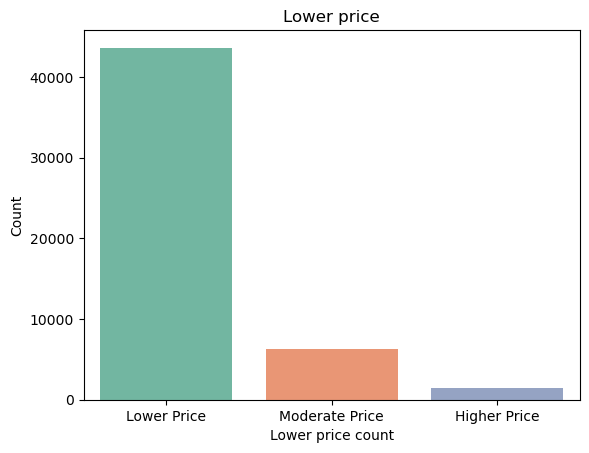

In [422]:
# Create a countplot with customizations
sns.countplot(x="price_range", data=df1, palette="Set2")

# Add labels
plt.xlabel("Lower price count")
plt.ylabel("Count")
plt.title("Lower price")

# Show the plot
plt.show()


# Competition and Market Share:
* Who are the top competitors in terms of ratings and popularity in each neighborhood?
* What is the perfect price range ?


#### Who are the top competitors in terms of ratings and popularity in each neighborhood?


In [261]:
filtered_df = df1.groupby(['neighborhood', 'name']).apply(lambda group: group[(group['rate'] > 4.5) & (group['votes'] > 1000)])


In [262]:
filtered_df

address  \
neighborhood name                                                                                      
BTM          AB's - Absolute Barbecues      8260   100 Feet Road, 1st Phase, Near Jayadeva Flyove...   
                                            10389  100 Feet Road, 1st Phase, Near Jayadeva Flyove...   
             Asia Kitchen By Mainland China 8275   136, Ground Floor, 1st Cross, 5th Block, Jyoti...   
                                            9099   136, Ground Floor, 1st Cross, 5th Block, Jyoti...   
                                            10879  136, Ground Floor, 1st Cross, 5th Block, Jyoti...   
...                                                                                              ...   
Whitefield   Mainland China                 50597  28/2, 1st Floor, Siddapura, Whitefield Main Ro...   
                                            51056  28/2, 1st Floor, Siddapura, Whitefield Main Ro...   
             Windmills Craftworks           51039  331, Road 5B, EPIP Area, Next to KTPO, Whitefi...   
                                            51650  331, Road 5B, EPIP Area, Next to KTPO, Whitefi...   
                                            51686  331, Road 5B, EPIP Area, Next to KTPO, Whitefi...   

                                                                             name  \
neighborhood name                                                                   
BTM          AB's - Absolute Barbecues      8260        AB's - Absolute Barbecues   
                                            10389       AB's - Absolute Barbecues   
             Asia Kitchen By Mainland China 8275   Asia Kitchen By Mainland China   
                                            9099   Asia Kitchen By Mainland China   
                                            10879  Asia Kitchen By Mainland China   
...                                                                           ...   
Whitefield   Mainland China                 50597                  Mainland China   
                                            51056                  Mainland China   
             Windmills Craftworks           51039            Windmills Craftworks   
                                            51650            Windmills Craftworks   
                                            51686            Windmills Craftworks   

                                                  online_order book_table  \
neighborhood name                                                           
BTM          AB's - Absolute Barbecues      8260            No        Yes   
                                            10389           No        Yes   
             Asia Kitchen By Mainland China 8275           Yes        Yes   
                                            9099           Yes        Yes   
                                            10879          Yes        Yes   
...                                                        ...        ...   
Whitefield   Mainland China                 50597          Yes        Yes   
                                            51056          Yes        Yes   
             Windmills Craftworks           51039           No         No   
                                            51650           No         No   
                                            51686           No         No   

                                                   rate  votes    city  \
neighborhood name                                                        
BTM          AB's - Absolute Barbecues      8260    4.9   6375     BTM   
                                            10389   4.9   6375     BTM   
             Asia Kitchen By Mainland China 8275    4.9   2178  others   
                                            9099    4.9   2178  others   
                                            10879   4.9   2178  others   
...                                                 ...    ...     ...   
Whitefield   Mainland China             

Top competitiors are in BTM Neighborhood and they are AB's - Absolute Barbecues and Asia Kitchen By Mainland China

In [263]:
filtered_df = df1.groupby(['neighborhood', 'name']).apply(lambda group: group[(group['rate'] > 4) & (group['votes'] > 600)])
filtered_df

address  \
neighborhood name                                                                                       
BTM          3B's - Buddies, Bar & Barbecues 8263   5th Floor, CPR Tower, 100 Feet Ring Road, 1st ...   
                                             10392  5th Floor, CPR Tower, 100 Feet Ring Road, 1st ...   
                                             11444  5th Floor, CPR Tower, 100 Feet Ring Road, 1st ...   
                                             11487  5th Floor, CPR Tower, 100 Feet Ring Road, 1st ...   
             A Hole Lotta Love Cafe          8334   59, 1st Floor, Diagonally Opposite JNC, Indust...   
...                                                                                               ...   
Whitefield   alt                             51051  Sky Deck, VR Bengaluru, Whitefield Main Road, ...   
                                             51653  Sky Deck, VR Bengaluru, Whitefield Main Road, ...   
                                             51683  Sky Deck, VR Bengaluru, Whitefield Main Road, ...   
             eat.fit                         50137  32/2G, NCPR Industrial Layout, Doddanakundi In...   
                                             50932  32/2G, NCPR Industrial Layout, Doddanakundi In...   

                                                                               name  \
neighborhood name                                                                     
BTM          3B's - Buddies, Bar & Barbecues 8263   3B's - Buddies, Bar & Barbecues   
                                             10392  3B's - Buddies, Bar & Barbecues   
                                             11444  3B's - Buddies, Bar & Barbecues   
                                             11487  3B's - Buddies, Bar & Barbecues   
             A Hole Lotta Love Cafe          8334            A Hole Lotta Love Cafe   
...                                                                             ...   
Whitefield   alt                             51051                              alt   
                                             51653                              alt   
                                             51683                              alt   
             eat.fit                         50137                          eat.fit   
                                             50932                          eat.fit   

                                                   online_order book_table  \
neighborhood name                                                            
BTM          3B's - Buddies, Bar & Barbecues 8263            No        Yes   
                                             10392           No        Yes   
                                             11444           No        Yes   
                                             11487           No        Yes   
             A Hole Lotta Love Cafe          8334           Yes         No   
...                                                         ...        ...   
Whitefield   alt                             51051           No        Yes   
                                             51653           No        Yes   
                                             51683           No        Yes   
             eat.fit                         50137          Yes         No   
                                             50932          Yes         No   

                                                    rate  votes    city  \
neighborhood name                                                         
BTM          3B's - Buddies, Bar & Barbecues 8263    4.4   1149     BTM   
                                             10392   4.4   1149     BTM   
                                             11444   4.4   1149     BTM   
                                             11487   4.4   1154     BTM   
             A Hole Lotta Love Cafe          8334    4.4   2859  others   
...                                                  ...

In [264]:
most_popular = df1['name'].value_counts().reset_index()
most_popular.columns = ['name', 'count']
most_popular
most_popular[most_popular['count']>60]

,name,count
0,Cafe Coffee Day,96
1,Onesta,85
2,Just Bake,73
3,Empire Restaurant,71
4,Five Star Chicken,70
5,Kanti Sweets,68
6,Petoo,66
7,Polar Bear,65
8,Baskin Robbins,64
9,Pizza Hut,62


In [265]:
# Filter the most_popular DataFrame for restaurants with a count greater than 60
popular_restaurants = most_popular[most_popular['count'] > 60]

# Extract the names of the popular restaurants
popular_restaurant_names = popular_restaurants['name']

# Filter the df1 DataFrame to get prices for popular restaurants
popular_restaurant_prices = df1[df1['name'].isin(popular_restaurant_names)][['name', 'approx_cost_2P']]

# Display the DataFrame with the names and prices of popular restaurants
popular_restaurant_prices


,name,approx_cost_2P
7,Onesta,600.0
22,Cafe Coffee Day,900.0
38,Empire Restaurant,750.0
44,Onesta,600.0
50,Petoo,450.0
...,...,...
51191,Cafe Coffee Day,650.0
51204,Pizza Hut,750.0
51355,Five Star Chicken,200.0
51399,Chef Baker's,400.0


<Axes: ylabel='Density'>

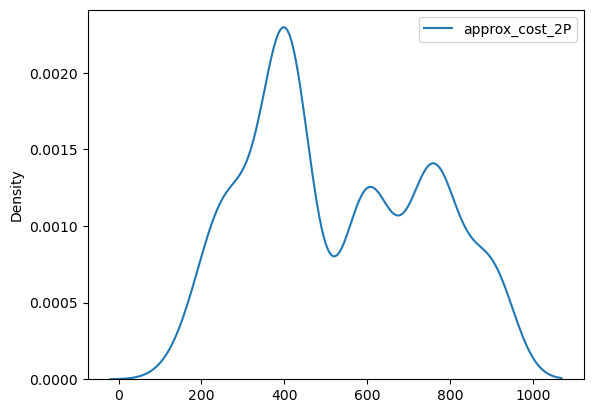

In [266]:
sns.kdeplot(data=popular_restaurant_prices)

* optimal price menu is from 200 to 1200 to stay competitor in the market and contribute to the market share

# Marketing and Promotion & insights conclusion:

* What marketing strategies can restaurants use to increase their online orders or table bookings?
* Are there any specific trends or promotions that correlate with higher customer engagement?
* Can you identify areas with potential for growth in the restaurant industry?


Zomato offers a variety of restaurant types and food options in Bangalore, with more than six categories available. Based on Zomato's insights, it's clear that the BTM neighborhood is the most popular choice for online orders and restaurant recommendations. Quick-bite restaurants dominate across neighborhoods, but there are exceptions in specific areas. This reflects cultural preferences in Bangalore, which favors quick-service and diverse food offerings.


#### What new dish should I add to my menu to cater to customer preferences?
According to our analysis, if you want to attract more attention, consider adding dishes from North Indian cuisines or biryani to your menu.

#### What is the best location to open my next restaurant outlet?
Koramangala, Bangalore, is the ideal location due to its high concentration of cafes and restaurants with strong user preferences. This aligns with research, as Koramangala is popular among young tech workers and students, offering trendy dining options and a vibrant atmosphere.

#### What menu prices are optimal to stay competitive in the city?
Optimal menu prices range from 150 to 900.

#### What marketing strategies can restaurants use to increase their online orders?
To boost online orders, consider offering online-exclusive discounts, promo codes (e.g., free drink with online orders), and collaborations with popular personalities in India. These strategies can be particularly effective for restaurants looking to enhance their online presence.

#### Are there any specific trends or promotions that correlate with higher customer engagement?

* Online ordering is the preferred method.
* Cuisine preferences include North Indian, Chinese, biryani, bakery, and cafes, especially in areas with numerous tech companies.
* Restaurants with prices ranging from 150 to 1500 are popular.
* Neighborhoods like BTM, Bannerghatta Road, Koramangala, and Basavanagudi are thriving.
* Fancy restaurants receive higher votes.
* Quick-bite establishments capture a significant market share.
* For online orders, delivery is the preferred choice, so focusing on efficient and safe deliveries is recommended.
#### Areas with Growth Potential in the Restaurant Industry:
BTM, Bannerghatta Road, Koramangala, and Basavanagudi are identified as areas with significant growth potential in the restaurant industry.



# Modeling 

## Model 1
* Focus on cuinsines and ratings to get the nearest point to specific restaurant and the model used is nearest neighbors.
* The output: Similar cuisines to your previous prefrence in terms of rating and cuisine type.

In [423]:
pivot = pd.pivot_table(df1, values="rate", index="name", columns="cuisines", fill_value=0)
pivot

cuisines,Andhra,"Andhra, Biryani",Arabian,Bakery,"Bakery, Desserts","Bakery, Fast Food",Beverages,"Beverages, Desserts","Beverages, Fast Food",Biryani,...,South Indian,"South Indian, Biryani","South Indian, Chinese","South Indian, Chinese, North Indian","South Indian, Fast Food","South Indian, North Indian","South Indian, North Indian, Chinese","South Indian, North Indian, Chinese, Street Food",Street Food,others
name,,,,,,,,,,,,,,,,,,,,,
#FeelTheROLL,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000
#L-81 Cafe,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000
#Vibes Restro,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0000
#refuel,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.7000
'Brahmins' Thatte Idli,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
late100,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.7000
nu.tree,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.2375
re:cess - Hilton Bangalore Embassy GolfLinks,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.1000


In [424]:
print(csc_matrix(pivot))

  (69, 0)	3.4
  (343, 0)	3.7
  (344, 0)	1.0
  (447, 0)	3.6
  (452, 0)	3.1
  (459, 0)	3.9
  (461, 0)	3.2
  (472, 0)	3.7000000000000006
  (749, 0)	3.5
  (943, 0)	4.0
  (1715, 0)	3.325
  (1987, 0)	3.1
  (1988, 0)	5.0
  (1992, 0)	3.7
  (3215, 0)	3.7
  (3219, 0)	4.0
  (4004, 0)	3.7249999999999996
  (4224, 0)	3.6
  (5060, 0)	3.1
  (5187, 0)	3.1
  (5190, 0)	3.7
  (5207, 0)	3.5625
  (5710, 0)	3.5
  (6012, 0)	3.6
  (6016, 0)	3.3
  :	:
  (8716, 69)	3.8
  (8717, 69)	3.0
  (8718, 69)	4.4
  (8719, 69)	3.7000000000000006
  (8720, 69)	3.317391304347826
  (8722, 69)	4.15
  (8723, 69)	3.7
  (8724, 69)	3.9
  (8729, 69)	2.6
  (8730, 69)	3.7
  (8731, 69)	3.7
  (8732, 69)	4.009090909090909
  (8734, 69)	3.6
  (8735, 69)	3.8
  (8737, 69)	4.3
  (8738, 69)	3.7
  (8743, 69)	4.3
  (8745, 69)	4.344897959183673
  (8746, 69)	3.8
  (8749, 69)	3.7000000000000006
  (8750, 69)	3.7
  (8751, 69)	4.2375
  (8752, 69)	4.1
  (8753, 69)	5.0
  (8754, 69)	3.7


<Figure size 640x480 with 0 Axes>

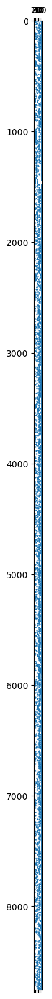

In [425]:
plt.figure()
fig, ax = plt.subplots(1, figsize=(6, 20))
ax.spy(pivot, markersize=0.5)

In [426]:
nn = NearestNeighbors(n_neighbors=5, metric="cosine")
nn.fit(pivot)

NearestNeighbors(metric='cosine')

In [427]:
rec = nn.kneighbors()[1]
rec

array([[3541,  940, 5310, 3548,  946],
       [1897, 8675, 1860, 8523, 6485],
       [6988, 3427, 6990, 6987, 6992],
       ...,
       [6988, 3427, 6990, 6987, 6992],
       [6988, 3427, 6990, 6987, 6992],
       [6988, 3427, 6990, 6987, 6992]], dtype=int64)

In [428]:
restaurants = pivot.index.to_list()
restaurants

['#FeelTheROLL',
 '#L-81 Cafe',
 '#Vibes Restro',
 '#refuel',
 "'Brahmins' Thatte Idli",
 '1 Fahreheit',
 '1000 B.C',
 '100Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x82Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â°C',
 '11 to 11 Express Biriyanis',
 '1131 Bar + Kitchen',
 '12th Main - Grand Mercure',
 '1441 Pizzeria',
 '1522 - The Pub',
 '154 Breakfast Club',
 '1722 Urban Bistro',
 '18+ Ice Cafe',
 '1947',
 '1980s Games Cafe',
 '1992 Chats - Space',
 '1Q1',
 '1TO3 Kitchen',
 '2 Statez',
 '20 Char - Sterlings MAC Hotel',
 '20 Feet High',
 '21 C - La Marvella Sarovar Premiere Hotel',
 '21 Corner Haus Cafe',
 '22S',
 '24 Carats - The Capitol',
 '24 Hours Cake Delivery',
 '24 Hours Coffee Drop - La Classic',
 '24/7 - The Lalit Ashok Bangalore',
 '24/7 Food Service',
 '24@43 - The Oterra',
 '24th Main',
 '29 Degrees North',
 '2nd Home Restaurant',
 '3 Leafs',
 '3 Spice',
 '30 Square',
 '360 Atoms Restaurant And Cafe',
 '36th Cross Coffee Mane',
 '37 China Town',
 '38 Sugar Lane',
 "3B's - Buddies, Bar & 

In [429]:
def recommend(restaurant_name):
    index = restaurants.index(restaurant_name)
    rec_list = []
    rec_df = pd.DataFrame()
    seen_restaurants = set()  # To keep track of seen restaurants
    i = 0  # Counter for recommendations
    while len(rec_list) < 5:
        recommended_restaurant = restaurants[rec[index][i]]
        if recommended_restaurant not in seen_restaurants:
            rec_list.append(recommended_restaurant)
            seen_restaurants.add(recommended_restaurant)
            rec_df = pd.concat([rec_df, df1[df1["name"] == recommended_restaurant]], ignore_index=True)
        i += 1
    return rec_list, rec_df


In [430]:
rec_list, rec_df = recommend('#FeelTheROLL')
rec_list

['Imli Express',
 'Bhavani Vada Pav',
 'New Students Corner',
 'In & Out',
 'Bhojan@99']

In [431]:
rec_df

,address,name,online_order,book_table,rate,votes,city,rest_type,cuisines,approx_cost_2P,reviews_list,eat_type,neighborhood,price_per_person,price_range
0,"204, 5th Main, 7th Cross, 1st Stage, Off 100 F...",Imli Express,No,No,2.0,0,others,"Takeaway, Delivery",Fast Food,150.0,"[('Rated 2.0', 'RATED\n Food quality is okayi...",Delivery,Indiranagar,75.0,Lower Price
1,"204, 5th Main, 7th Cross, 1st Stage, Off 100 F...",Imli Express,No,No,1.5,0,others,"Takeaway, Delivery",Fast Food,150.0,"[('Rated 1.0', 'RATED\n Worst place IÃ\x83Ã...",Delivery,Old Airport Road,75.0,Lower Price
2,"26/1, Triveni Road, Mathikere Extension, Mathi...",Bhavani Vada Pav,Yes,No,4.0,106,Yeshwantpur,Quick Bites,Fast Food,150.0,"[('Rated 4.0', 'RATED\n A very place to have ...",Delivery,Malleshwaram,75.0,Lower Price
3,"26/1, Triveni Road, Mathikere Extension, Mathi...",Bhavani Vada Pav,Yes,No,4.0,106,Yeshwantpur,Quick Bites,Fast Food,150.0,"[('Rated 4.0', 'RATED\n A very place to have ...",Delivery,New BEL Road,75.0,Lower Price
4,"95, Dayanand Sagar College Main Road, Teachers...",New Students Corner,No,No,3.6,17,Kumaraswamy Layout,Quick Bites,Fast Food,150.0,"[('Rated 4.0', 'RATED\n Its been almost 4 yea...",Dine-out,JP Nagar,75.0,Lower Price
5,"2,1st Main, Kalathur Layout, Jalahalli, Bangalore",In & Out,No,No,3.7,0,others,Quick Bites,Fast Food,250.0,[],Dine-out,New BEL Road,125.0,Lower Price
6,"77/2, Ground Floor, BDA Road, Opposite RR Layo...",Bhojan@99,Yes,No,3.7,0,Bannerghatta Road,Quick Bites,Fast Food,200.0,[],Delivery,Bannerghatta Road,100.0,Lower Price
7,"77/2, Ground Floor, BDA Road, Opposite RR Layo...",Bhojan@99,Yes,No,3.7,0,Bannerghatta Road,Quick Bites,Fast Food,200.0,[],Dine-out,Bannerghatta Road,100.0,Lower Price
8,"77/2, Ground Floor, BDA Road, Opposite RR Layo...",Bhojan@99,Yes,No,3.7,0,Bannerghatta Road,Quick Bites,Fast Food,200.0,[],Delivery,BTM,100.0,Lower Price
9,"98, Shop 02, Ground Floor, Behind Ajmera Apart...",Bhojan@99,Yes,No,5.0,0,others,"Takeaway, Delivery",Fast Food,200.0,"[('Rated 5.0', 'RATED\n \nAmazing home like co...",Delivery,Electronic City,100.0,Lower Price


In [435]:
# Drop rows with repeated values in the 'name' column
rec_df_filtered = rec_df.drop_duplicates(subset=['name'])

# Display the resulting DataFrame
rec_df_filtered



,address,name,online_order,book_table,rate,votes,city,rest_type,cuisines,approx_cost_2P,reviews_list,eat_type,neighborhood,price_per_person,price_range
0,"204, 5th Main, 7th Cross, 1st Stage, Off 100 F...",Imli Express,No,No,2.0,0,others,"Takeaway, Delivery",Fast Food,150.0,"[('Rated 2.0', 'RATED\n Food quality is okayi...",Delivery,Indiranagar,75.0,Lower Price
2,"26/1, Triveni Road, Mathikere Extension, Mathi...",Bhavani Vada Pav,Yes,No,4.0,106,Yeshwantpur,Quick Bites,Fast Food,150.0,"[('Rated 4.0', 'RATED\n A very place to have ...",Delivery,Malleshwaram,75.0,Lower Price
4,"95, Dayanand Sagar College Main Road, Teachers...",New Students Corner,No,No,3.6,17,Kumaraswamy Layout,Quick Bites,Fast Food,150.0,"[('Rated 4.0', 'RATED\n Its been almost 4 yea...",Dine-out,JP Nagar,75.0,Lower Price
5,"2,1st Main, Kalathur Layout, Jalahalli, Bangalore",In & Out,No,No,3.7,0,others,Quick Bites,Fast Food,250.0,[],Dine-out,New BEL Road,125.0,Lower Price
6,"77/2, Ground Floor, BDA Road, Opposite RR Layo...",Bhojan@99,Yes,No,3.7,0,Bannerghatta Road,Quick Bites,Fast Food,200.0,[],Delivery,Bannerghatta Road,100.0,Lower Price


* The above table is the output of the model (recommend five restaurants)

## Model_2

* in this model we work on more features to recommend restaurant that more related to specific prefrence 

In [437]:
df_test = df1.copy().drop(["address", "neighborhood",'reviews_list','price_range'], axis=1)

online_order_encoder = LabelEncoder()
book_table_encoder = LabelEncoder()
restaurant_name_encoder = LabelEncoder()
rest_type_encoder = LabelEncoder()
cuisines_encoder = LabelEncoder()
eat_type_encoder = LabelEncoder()
city_encoder = LabelEncoder()

df_test["online_order"] = online_order_encoder.fit_transform(df_test["online_order"])
df_test["book_table"] = book_table_encoder.fit_transform(df_test["book_table"])
df_test["name"] = restaurant_name_encoder.fit_transform(df_test["name"])
df_test["rest_type"] = rest_type_encoder.fit_transform(df_test["rest_type"])
df_test["cuisines"] = cuisines_encoder.fit_transform(df_test["cuisines"])
df_test["eat_type"] = eat_type_encoder.fit_transform(df_test["eat_type"])
df_test["city"] = city_encoder.fit_transform(df_test["city"])

df_test = df_test.dropna()
df_test

,name,online_order,book_table,rate,votes,city,rest_type,cuisines,approx_cost_2P,eat_type,price_per_person
0,3676,1,1,4.1,775,1,2,54,800.0,0,400.0
1,6992,1,0,4.1,787,1,2,69,800.0,0,400.0
2,6472,1,0,3.8,918,1,8,69,800.0,0,400.0
3,198,0,0,3.7,88,1,6,65,300.0,0,150.0
4,2930,0,0,3.8,166,4,2,69,600.0,0,300.0
...,...,...,...,...,...,...,...,...,...,...,...
51712,896,0,0,3.6,27,55,8,26,1500.0,6,750.0
51713,8468,0,0,3.7,0,55,8,35,600.0,6,300.0
51714,5808,0,0,3.7,0,55,8,35,2000.0,6,1000.0
51715,1722,0,1,4.3,236,16,8,35,2500.0,6,1250.0


k: 1, cost: 379017552629.07715
k: 2, cost: 128106560219.20358
k: 3, cost: 81543856668.81754
k: 4, cost: 65998925850.62428
k: 5, cost: 50830349314.23989
k: 6, cost: 43344872299.264206
k: 7, cost: 38684575148.11616
k: 8, cost: 35041245829.38166
k: 9, cost: 30628971339.735268
k: 10, cost: 28394139799.450623


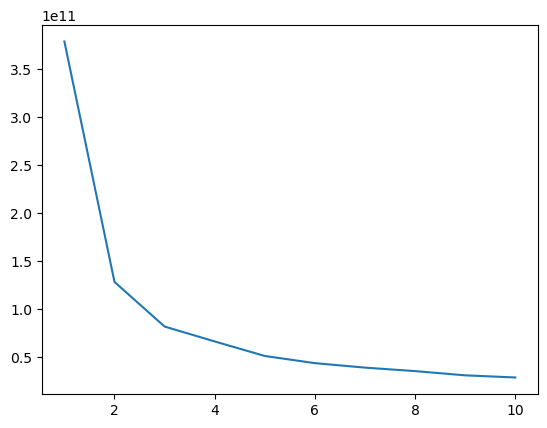

In [438]:
costs = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init="k-means++")
    kmeans.fit(df_test)
    print("k: {}, cost: {}".format(i, kmeans.inertia_))
    costs.append(kmeans.inertia_)
    
plt.figure()
plt.plot([i for i in range(1, 11)], costs)

* the best k is 3

In [439]:
kmeans = KMeans(n_clusters=3, init="k-means++")
kmeans.fit(df_test)

KMeans(n_clusters=3)

In [440]:
nn = NearestNeighbors(n_neighbors=5, metric="cosine")
nn.fit(df_test)

NearestNeighbors(metric='cosine')

In [441]:
restaurants = restaurant_name_encoder.inverse_transform(df_test["name"]).tolist()
restaurants

['Jalsa',
 'Spice Elephant',
 'San Churro Cafe',
 'Addhuri Udupi Bhojana',
 'Grand Village',
 'Timepass Dinner',
 'Rosewood International Hotel - Bar & Restaurant',
 'Onesta',
 'Penthouse Cafe',
 'Smacznego',
 'CafÃ\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x83Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â© Down The Alley',
 'Cafe Shuffle',
 'The Coffee Shack',
 'Caf-Eleven',
 'San Churro Cafe',
 'Cafe Vivacity',
 'Catch-up-ino',
 "Kirthi's Biryani",
 'T3H Cafe',
 '360 Atoms Restaurant And Cafe',
 'The Vintage Cafe',
 'Woodee Pizza',
 'Cafe Coffee Day',
 'My Tea House',
 'Hide Out Cafe',
 'CAFE NOVA',
 'Coffee Tindi',
 'Sea Green Cafe',
 'Cuppa',
 "Srinathji's Cafe",
 'Redberrys',
 'Foodiction',
 'Sweet Truth',
 'Ovenstory Pizza',
 'Faasos',
 'Behrouz Biryani',
 'Fast And Fresh',
 'Szechuan Dragon',
 'Empire Restaurant',
 'Maruthi Davangere Benne Dosa',
 'Chaatimes',
 'Havyaka Mess',
 "McDonald's",
 "Domino's Pizza",
 'Onesta',
 'Hotboxit',
 'Kitchen Garden',
 'Recipe',
 'Beijing Bites',
 'Tasty Bytes'

In [442]:
rec_list, rec_df = recommend('#FeelTheROLL')
rec_list

['Brahmin Cafe',
 'Midnight Mania',
 'NoLimmits Lounge and Club',
 'Bangalore Agarwal Bhavan',
 'Momoz']

In [443]:
rec_df

,address,name,online_order,book_table,rate,votes,city,rest_type,cuisines,approx_cost_2P,reviews_list,eat_type,neighborhood,price_per_person,price_range
0,"6, 10th Main, Opposite Post Office, 2nd Block,...",Brahmin Cafe,No,No,3.8,19,Banashankari,Quick Bites,South Indian,150.0,"[('Rated 5.0', 'RATED\n Good food taste and d...",Dine-out,Banashankari,75.0,Lower Price
1,"6, 10th Main, Opposite Post Office, 2nd Block,...",Brahmin Cafe,No,No,3.8,19,Banashankari,Quick Bites,South Indian,150.0,"[('Rated 5.0', 'RATED\n Good food taste and d...",Dine-out,Basavanagudi,75.0,Lower Price
2,"43, Arasu Nilaya 1st Floor, Opp To Patel Medic...",Midnight Mania,Yes,No,4.1,601,BTM,Quick Bites,others,700.0,"[('Rated 5.0', 'RATED\n Order from zomato . O...",Delivery,Bannerghatta Road,350.0,Lower Price
3,"Shop 2, Park Nest Apartment, Near Munekolala G...",Midnight Mania,Yes,No,3.8,599,Marathahalli,Delivery,others,700.0,"[('Rated 5.0', ""RATED\n I just love pizzas fr...",Delivery,Brookefield,350.0,Lower Price
4,"43, Arasu Nilaya 1st Floor, Opp To Patel Medic...",Midnight Mania,Yes,No,4.1,601,BTM,Quick Bites,others,700.0,"[('Rated 5.0', 'RATED\n Order from zomato . O...",Delivery,BTM,350.0,Lower Price
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66,"A/4, KHB Colony, Near Airtel Office, 5th Block...",Momoz,No,No,3.9,626,others,Casual Dining,"Chinese, Momos",600.0,"[('Rated 3.0', 'RATED\n This place is pretty ...",Dine-out,Koramangala 5th Block,300.0,Lower Price
67,"A/4, KHB Colony, Near Airtel Office, 5th Block...",Momoz,No,No,3.9,626,others,Casual Dining,"Chinese, Momos",600.0,"[('Rated 3.0', 'RATED\n This place is pretty ...",Delivery,Koramangala 6th Block,300.0,Lower Price
68,"A/4, KHB Colony, Near Airtel Office, 5th Block...",Momoz,No,No,3.9,626,others,Casual Dining,"Chinese, Momos",600.0,"[('Rated 3.0', 'RATED\n This place is pretty ...",Dine-out,Koramangala 6th Block,300.0,Lower Price
69,"A/4, KHB Colony, Near Airtel Office, 5th Block...",Momoz,No,No,3.9,626,others,Casual Dining,"Chinese, Momos",600.0,"[('Rated 3.0', 'RATED\n This place is pretty ...",Delivery,Koramangala 7th Block,300.0,Lower Price


In [444]:
# Drop rows with repeated values in the 'name' column
rec_df_filtered = rec_df.drop_duplicates(subset=['name'])

# Display the resulting DataFrame
rec_df_filtered


,address,name,online_order,book_table,rate,votes,city,rest_type,cuisines,approx_cost_2P,reviews_list,eat_type,neighborhood,price_per_person,price_range
0,"6, 10th Main, Opposite Post Office, 2nd Block,...",Brahmin Cafe,No,No,3.8,19,Banashankari,Quick Bites,South Indian,150.0,"[('Rated 5.0', 'RATED\n Good food taste and d...",Dine-out,Banashankari,75.0,Lower Price
2,"43, Arasu Nilaya 1st Floor, Opp To Patel Medic...",Midnight Mania,Yes,No,4.1,601,BTM,Quick Bites,others,700.0,"[('Rated 5.0', 'RATED\n Order from zomato . O...",Delivery,Bannerghatta Road,350.0,Lower Price
14,"8, 2nd Floor, Allied Grande Plaza, Diagonally ...",NoLimmits Lounge and Club,Yes,Yes,4.0,2103,others,others,others,2000.0,"[('Rated 3.0', 'RATED\n The disc space is ama...",Delivery,Brigade Road,1000.0,Higher Price
31,"36/1, 27th Cross, 4th Block, Jayanagar, Bangalore",Bangalore Agarwal Bhavan,Yes,No,3.9,134,Jayanagar,Quick Bites,others,400.0,"[('Rated 3.0', 'RATED\n Had been here for lun...",Delivery,Banashankari,200.0,Lower Price
53,"806, Near ICICI Bank, 7th Cross, 16th Main, 2n...",Momoz,Yes,No,4.0,939,BTM,Casual Dining,"Chinese, Momos",600.0,"[('Rated 5.0', 'RATED\n I love this place. We...",Delivery,Bannerghatta Road,300.0,Lower Price


## Model_3

* In this model, we added additional feature to our recommender as asking user to enter his/her location and based on this , we recommend nearest restaurants.
* The model used is kmeans for clustring and metrics are elbow method and silhoute score.
* Here we worked on sample of data in which we get the lng and lat for to use in modeling based on location.
* output: nearest restaurants to the user.


In [446]:
df2

,address,Latitude,Longitude,name,online_order,book_table,rate,votes,city,rest_type,cuisines,approx_cost_2P,eat_type,neighborhood
0,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",12.926865,77.550920,Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800.0,Buffet,Banashankari
1,"1112, Next to KIMS Medical College, 17th Cross...",12.982465,77.537233,San Churro Cafe,Yes,No,3.8,918,Banashankari,others,"Cafe, Mexican, Italian",800.0,Buffet,Banashankari
2,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",12.923441,77.551194,Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300.0,Buffet,Banashankari
3,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",12.946119,77.570255,Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600.0,Buffet,Banashankari
4,"37, 5-1, 4th Floor, Bosco Court, Gandhi Bazaar...",12.946119,77.570255,Timepass Dinner,Yes,No,3.8,286,Basavanagudi,Casual Dining,North Indian,600.0,Buffet,Banashankari
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5085,"The Ambara, 22, Annaswami Mudaliar Road, Near ...",12.984001,77.617386,Cafe Cerrise,No,No,3.8,99,others,Cafe,"Cafe, Continental, Salad",600.0,Cafes,Brigade Road
5086,Church Street,12.974364,77.607734,Rasta,No,No,3.6,0,others,others,"Continental, Cafe",1000.0,Cafes,Brigade Road
5087,"Lal Bagh Main Road, Sampangi Rama Nagar, Near ...",12.958772,77.586607,Bread and Circus,Yes,No,3.7,50,others,Cafe,"Cafe, Fast Food, Pizza, Burger",550.0,Cafes,Brigade Road
5088,"23, HKP Road Broadway",12.988790,77.602453,Savera Cafe,No,No,3.7,11,others,Cafe,Cafe,50.0,Cafes,Brigade Road


In [447]:
df2.name.value_counts()

Cafe Coffee Day      16
Five Star Chicken    12
Just Bake            11
Lassi Shop           11
Petoo                11
                     ..
Bao & Grills          1
Yumme                 1
Kalakki Biryani       1
Sri SLV Bhavan        1
Aubree                1
Name: name, Length: 2463, dtype: int64

In [448]:
coords = df2[['Longitude','Latitude']]

distortions = []
K = range(1,30)
for k in K:
    kmeansModel = KMeans(n_clusters=k)
    kmeansModel = kmeansModel.fit(coords)
    distortions.append(kmeansModel.inertia_)

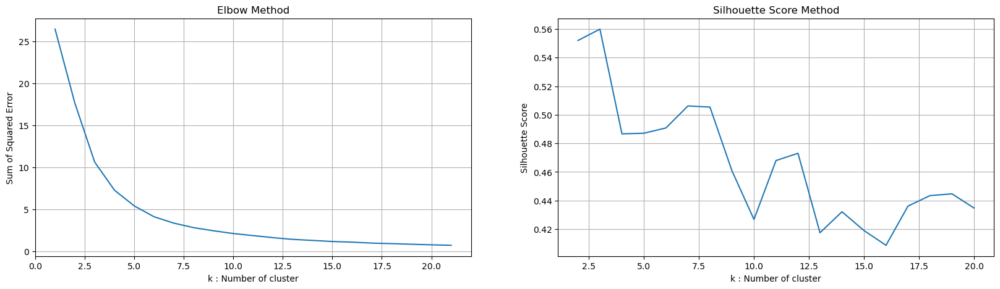

In [449]:
#Let's choose K using two different techniques elbow and Silhouette
sse = {};sil = [];kmax = 20
fig = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

# Elbow Method :
plt.subplot(1,2,1)
for k in range(1, 22):
    kmeansModel = KMeans(n_clusters=k)
    kmeansModel = kmeansModel.fit(coords)
    sse[k] = kmeansModel.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
sns.lineplot(x = list(sse.keys()), y = list(sse.values()));
plt.title('Elbow Method')
plt.xlabel("k : Number of cluster")
plt.ylabel("Sum of Squared Error")
plt.grid()

# Silhouette Score Method
plt.subplot(1,2,2)
for k in range(2, kmax + 1):
    kmeansModel = KMeans(n_clusters=k)
    kmeansModel = kmeansModel.fit(coords)
    labels = kmeansModel.labels_
    sil.append(silhouette_score(coords, labels, metric = 'euclidean'))
sns.lineplot(x = range(2,kmax + 1), y = sil);
plt.title('Silhouette Score Method')
plt.xlabel("k : Number of cluster")
plt.ylabel("Silhouette Score")
plt.grid()

plt.show()

In [450]:
sil = []
kmax = 20

# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in range(2, kmax+1):
  kmeans = KMeans(n_clusters = k).fit(coords)
  labels = kmeans.labels_
  sil.append(silhouette_score(coords, labels, metric = 'euclidean'))

In [451]:
sil

[0.5519724121029248,
 0.5670726318242426,
 0.4854958094632476,
 0.48702055815117334,
 0.4905483410449822,
 0.5054802034020689,
 0.506628779403602,
 0.4594715180746115,
 0.4911283379566739,
 0.4680115089066851,
 0.47323802031213935,
 0.4172609707522226,
 0.4033317242076719,
 0.4255001537023006,
 0.418237113733956,
 0.4278472929838294,
 0.436234762018065,
 0.4456123564389421,
 0.4294631346464246]

In [452]:
kmeans = KMeans(n_clusters=5, init='k-means++')
kmeans.fit(coords)
y = kmeans.labels_
print("k = 5", " silhouette_score ", silhouette_score(coords, y, metric='euclidean'))

k = 5  silhouette_score  0.4876143648267957


In [453]:
df2['cluster'] = kmeans.predict(df2[['Longitude','Latitude']])
df2.head()

,address,Latitude,Longitude,name,online_order,book_table,rate,votes,city,rest_type,cuisines,approx_cost_2P,eat_type,neighborhood,cluster
0,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",12.926865,77.550920,Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800.0,Buffet,Banashankari,1
1,"1112, Next to KIMS Medical College, 17th Cross...",12.982465,77.537233,San Churro Cafe,Yes,No,3.8,918,Banashankari,others,"Cafe, Mexican, Italian",800.0,Buffet,Banashankari,1
2,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",12.923441,77.551194,Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300.0,Buffet,Banashankari,1
3,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",12.946119,77.570255,Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600.0,Buffet,Banashankari,1
4,"37, 5-1, 4th Floor, Bosco Court, Gandhi Bazaar...",12.946119,77.570255,Timepass Dinner,Yes,No,3.8,286,Basavanagudi,Casual Dining,North Indian,600.0,Buffet,Banashankari,1


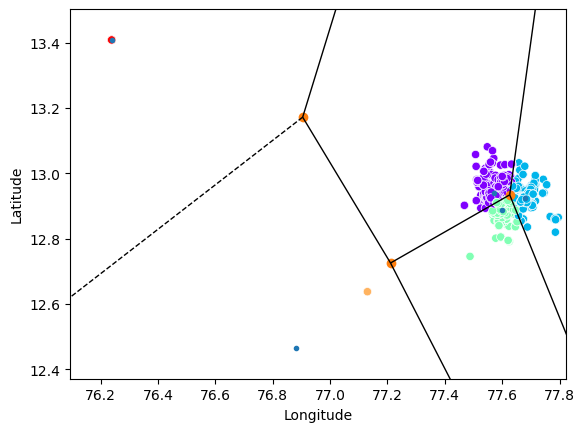

In [454]:
from scipy.spatial import Voronoi, voronoi_plot_2d
df2['initial_cluster'] = kmeans.fit_predict(coords)

sns.scatterplot(x='Longitude', y='Latitude', hue='initial_cluster', data=df2, palette='rainbow', legend=False)

cluster = kmeans.cluster_centers_
vor = Voronoi(cluster)
fig = voronoi_plot_2d(vor, plt.gca())

In [455]:
df2['cluster'] = kmeans.predict(df2[['Longitude','Latitude']])
df2.head()

,address,Latitude,Longitude,name,online_order,book_table,rate,votes,city,rest_type,cuisines,approx_cost_2P,eat_type,neighborhood,cluster,initial_cluster
0,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",12.926865,77.550920,Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800.0,Buffet,Banashankari,0,0
1,"1112, Next to KIMS Medical College, 17th Cross...",12.982465,77.537233,San Churro Cafe,Yes,No,3.8,918,Banashankari,others,"Cafe, Mexican, Italian",800.0,Buffet,Banashankari,0,0
2,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",12.923441,77.551194,Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300.0,Buffet,Banashankari,0,0
3,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",12.946119,77.570255,Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600.0,Buffet,Banashankari,0,0
4,"37, 5-1, 4th Floor, Bosco Court, Gandhi Bazaar...",12.946119,77.570255,Timepass Dinner,Yes,No,3.8,286,Basavanagudi,Casual Dining,North Indian,600.0,Buffet,Banashankari,0,0


In [456]:
df2['cluster'].value_counts()

0    2294
2    1556
1    1190
3       4
4       3
Name: cluster, dtype: int64

In [468]:
top_restaurants_df2 = df2.sort_values(by=['votes', 'rate'], ascending=False)
top_restaurants_df2.head(20)

,address,Latitude,Longitude,name,online_order,book_table,rate,votes,city,rest_type,cuisines,approx_cost_2P,eat_type,neighborhood,cluster,initial_cluster
3920,"Behind MK Retail, Sarjapur Road, Bangalore",12.911713,77.682759,Byg Brewski Brewing Company,Yes,Yes,4.9,16345,Sarjapur Road,others,"Continental, North Indian, Italian, South Indi...",1600.0,Delivery,Bellandur,1,1
4800,"Behind MK Retail, Sarjapur Road, Bangalore",12.911713,77.682759,Byg Brewski Brewing Company,Yes,Yes,4.9,16345,Sarjapur Road,others,"Continental, North Indian, Italian, South Indi...",1600.0,Dine-out,Bellandur,1,1
4943,"Behind MK Retail, Sarjapur Road, Bangalore",12.911713,77.682759,Byg Brewski Brewing Company,Yes,Yes,4.9,16345,Sarjapur Road,others,"Continental, North Indian, Italian, South Indi...",1600.0,Drinks & nightlife,Bellandur,1,1
4130,"2034/69, Block 2, Kaikondrahalli, Varthur Hobl...",12.909775,77.681363,Hoot,Yes,Yes,4.2,7193,Sarjapur Road,others,"Continental, Italian, North Indian",1400.0,Delivery,Bellandur,1,1
4801,"2034/69, Block 2, Kaikondrahalli, Varthur Hobl...",12.909775,77.681363,Hoot,Yes,Yes,4.2,7193,Sarjapur Road,others,"Continental, Italian, North Indian",1400.0,Dine-out,Bellandur,1,1
4944,"2034/69, Block 2, Kaikondrahalli, Varthur Hobl...",12.909775,77.681363,Hoot,Yes,Yes,4.2,7193,Sarjapur Road,others,"Continental, Italian, North Indian",1400.0,Drinks & nightlife,Bellandur,1,1
4963,"2034/69, Block 2, Kaikondrahalli, Varthur Hobl...",12.909775,77.681363,Hoot,Yes,Yes,4.2,7193,Sarjapur Road,others,"Continental, Italian, North Indian",1400.0,Pubs and bars,Bellandur,1,1
3761,"20/7, Swamy Legato, Outer Ring Road, Kadubeesa...",12.937844,77.693855,The Black Pearl,No,Yes,4.8,7023,Marathahalli,"Casual Dining, Bar","North Indian, European, Mediterranean, BBQ",1500.0,Buffet,Bellandur,1,1
4799,"20/7, Swamy Legato, Outer Ring Road, Kadubeesa...",12.937844,77.693855,The Black Pearl,No,Yes,4.8,7023,Marathahalli,"Casual Dining, Bar","North Indian, European, Mediterranean, BBQ",1500.0,Dine-out,Bellandur,1,1
4962,"20/7, Swamy Legato, Outer Ring Road, Kadubeesa...",12.937844,77.693855,The Black Pearl,No,Yes,4.8,7023,Marathahalli,"Casual Dining, Bar","North Indian, European, Mediterranean, BBQ",1500.0,Pubs and bars,Bellandur,1,1


In [471]:
def recommend_restaurants(df, longitude, latitude):
    cluster = kmeans.predict(np.array([longitude, latitude]).reshape(1,-1))[0]
    print(cluster)
   
    result_df = df[df['cluster'] == cluster].iloc[0:7][['name', 'Latitude', 'Longitude']]
    
    # Remove duplicate rows based on 'name' column
    result_df = result_df.drop_duplicates(subset='name')
    
    return result_df


In [472]:
X=recommend_restaurants(top_restaurants_df2, 12.9959775, 77.981363)
X

4


,name,Latitude,Longitude
994,Krishna Kuteera South,13.408027,76.238135
1230,Triveni,13.408027,76.238135


In [473]:
import folium
import os 
# Create a map centered around the first location
m = folium.Map(location=[X['Latitude'].iloc[0], X['Longitude'].iloc[0]], zoom_start=12)

# Add markers for each restaurant using 'name' as label
for index, row in X.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['name'],
    ).add_to(m)

# Save the map to an HTML file
m.save('restaurant_map.html')
current_directory = os.getcwd()
print("Current working directory:", current_directory)

Current working directory: C:\Users\MBR


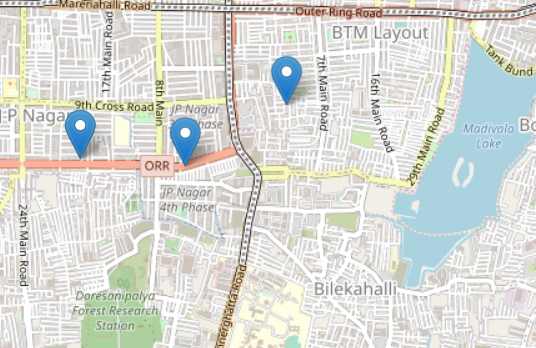

* nearest places to given location

## Popularity_Method

In [300]:
data_grouped = df1.groupby('name').agg({'rate':'count'}).reset_index()
data_grouped.rename(columns = {'rate': 'score'}, inplace = True )
data_sort = data_grouped.sort_values(['score','name'], ascending = False)
data_sort.head()

,name,score
1315,Cafe Coffee Day,96
5526,Onesta,85
3774,Just Bake,73
2436,Empire Restaurant,71
2567,Five Star Chicken,70


In [301]:
data_sort['Rank'] = data_sort['score'].rank(ascending = 0, method = 'first')
pop_recom = data_sort
pop_recom.head()

,name,score,Rank
1315,Cafe Coffee Day,96,1.0
5526,Onesta,85,2.0
3774,Just Bake,73,3.0
2436,Empire Restaurant,71,4.0
2567,Five Star Chicken,70,5.0


In [302]:
print('Here are the most popular restaurants')
pop_recom[['name','score','Rank']].head()

Here are the most popular restaurants


,name,score,Rank
1315,Cafe Coffee Day,96,1.0
5526,Onesta,85,2.0
3774,Just Bake,73,3.0
2436,Empire Restaurant,71,4.0
2567,Five Star Chicken,70,5.0


* This method is embedded in most of the online food webistes , depending on suggesting most popular places to any user enter the website

# Model_4

* In this approach we worked on preprocessing reviews of the restaurant and measure similaries between them , then recommend based on similar reviews.
*  The TF-IDF vectorizer used to analyze the words and we focused on top unique words.
* output: top 10 restaurants in terms of review similarty, rate and cost.

In [303]:
df3=df1.copy()

In [304]:
df3

,address,name,online_order,book_table,rate,votes,city,rest_type,cuisines,approx_cost_2P,reviews_list,eat_type,neighborhood,price_per_person,price_range
0,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",Buffet,Banashankari,400.0,Moderate Price
1,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,others,800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",Buffet,Banashankari,400.0,Moderate Price
2,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,Banashankari,others,others,800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",Buffet,Banashankari,400.0,Moderate Price
3,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",Buffet,Banashankari,150.0,Lower Price
4,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,others,600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",Buffet,Banashankari,300.0,Lower Price
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51712,"Four Points by Sheraton Bengaluru, 43/3, White...",Best Brews - Four Points by Sheraton Bengaluru...,No,No,3.6,27,others,others,Continental,1500.0,"[('Rated 5.0', ""RATED\n Food and service are ...",Pubs and bars,Whitefield,750.0,Moderate Price
51713,"Number 10, Garudachar Palya, Mahadevapura, Whi...",Vinod Bar And Restaurant,No,No,3.7,0,others,others,Finger Food,600.0,[],Pubs and bars,Whitefield,300.0,Lower Price
51714,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Plunge - Sheraton Grand Bengaluru Whitefield H...,No,No,3.7,0,others,others,Finger Food,2000.0,[],Pubs and bars,Whitefield,1000.0,Higher Price
51715,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Chime - Sheraton Grand Bengaluru Whitefield Ho...,No,Yes,4.3,236,"ITPL Main Road, Whitefield",others,Finger Food,2500.0,"[('Rated 4.0', 'RATED\n Nice and friendly pla...",Pubs and bars,Whitefield,1250.0,Higher Price


In [305]:
pip install nltk


Note: you may need to restart the kernel to use updated packages.


In [306]:
import nltk
nltk.download('stopwords')


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\MBR\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [307]:
import re 

In [308]:
## Lower Casing
import nltk
df3["reviews_list"] = df3["reviews_list"].str.lower()

## Removal of Puctuations
import string
PUNCT_TO_REMOVE = string.punctuation
def remove_punctuation(text):
    """custom function to remove the punctuation"""
    return text.translate(str.maketrans('', '', PUNCT_TO_REMOVE))

df3["reviews_list"] = df3["reviews_list"].apply(lambda text: remove_punctuation(text))

## Removal of Stopwords
from nltk.corpus import stopwords
STOPWORDS = set(stopwords.words('english'))
def remove_stopwords(text):
    """custom function to remove the stopwords"""
    return " ".join([word for word in str(text).split() if word not in STOPWORDS])

df3["reviews_list"] = df3["reviews_list"].apply(lambda text: remove_stopwords(text))

## Removal of URLS
def remove_urls(text):
    url_pattern = re.compile(r'https?://\S+|www\.\S+')
    return url_pattern.sub(r'', text)

df3["reviews_list"] = df3["reviews_list"].apply(lambda text: remove_urls(text))

df3[['reviews_list', 'cuisines']].sample(5)

,reviews_list,cuisines
47794,rated 40 ratedn place cosy ambience quite nice...,others
46485,rated 35 ratedn nice place drinks bar attached...,"Chinese, North Indian"
39927,,others
11506,rated 40 ratedn first time bfc get together fo...,North Indian
10948,rated 50 ratedn orderd drumstick cafe mind blo...,others


* after cleaning review column through text preprocessing techniques.

In [309]:
df3.isna().sum()

address             0
name                0
online_order        0
book_table          0
rate                0
votes               0
city                0
rest_type           0
cuisines            0
approx_cost_2P      0
reviews_list        0
eat_type            0
neighborhood        0
price_per_person    0
price_range         0
dtype: int64

In [310]:
df3.dropna(inplace=True)

In [311]:
df3

,address,name,online_order,book_table,rate,votes,city,rest_type,cuisines,approx_cost_2P,reviews_list,eat_type,neighborhood,price_per_person,price_range
0,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800.0,rated 40 ratedn beautiful place dine inthe int...,Buffet,Banashankari,400.0,Moderate Price
1,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,others,800.0,rated 40 ratedn dinner family turned good choo...,Buffet,Banashankari,400.0,Moderate Price
2,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,Banashankari,others,others,800.0,rated 30 ratedn ambience good enough pocket fr...,Buffet,Banashankari,400.0,Moderate Price
3,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300.0,rated 40 ratedn great food proper karnataka st...,Buffet,Banashankari,150.0,Lower Price
4,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,others,600.0,rated 40 ratedn good restaurant neighbourhood ...,Buffet,Banashankari,300.0,Lower Price
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51712,"Four Points by Sheraton Bengaluru, 43/3, White...",Best Brews - Four Points by Sheraton Bengaluru...,No,No,3.6,27,others,others,Continental,1500.0,rated 50 ratedn food service incomparably exce...,Pubs and bars,Whitefield,750.0,Moderate Price
51713,"Number 10, Garudachar Palya, Mahadevapura, Whi...",Vinod Bar And Restaurant,No,No,3.7,0,others,others,Finger Food,600.0,,Pubs and bars,Whitefield,300.0,Lower Price
51714,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Plunge - Sheraton Grand Bengaluru Whitefield H...,No,No,3.7,0,others,others,Finger Food,2000.0,,Pubs and bars,Whitefield,1000.0,Higher Price
51715,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Chime - Sheraton Grand Bengaluru Whitefield Ho...,No,Yes,4.3,236,"ITPL Main Road, Whitefield",others,Finger Food,2500.0,rated 40 ratedn nice friendly place staff awes...,Pubs and bars,Whitefield,1250.0,Higher Price


In [312]:
df3.isna().sum()

address             0
name                0
online_order        0
book_table          0
rate                0
votes               0
city                0
rest_type           0
cuisines            0
approx_cost_2P      0
reviews_list        0
eat_type            0
neighborhood        0
price_per_person    0
price_range         0
dtype: int64

In [313]:
from sklearn.metrics.pairwise import linear_kernel
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

In [314]:
# RESTAURANT NAMES:
restaurant_names = list(df3['name'].unique())
def get_top_words(column, top_nu_of_words, nu_of_word):
    vec = CountVectorizer(ngram_range= nu_of_word, stop_words='english')
    bag_of_words = vec.fit_transform(column)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:top_nu_of_words]
    

# Randomly sample 60% of your dataframe
df_percent = df3.sample(frac=0.05)

In [315]:
df3

,address,name,online_order,book_table,rate,votes,city,rest_type,cuisines,approx_cost_2P,reviews_list,eat_type,neighborhood,price_per_person,price_range
0,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800.0,rated 40 ratedn beautiful place dine inthe int...,Buffet,Banashankari,400.0,Moderate Price
1,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,others,800.0,rated 40 ratedn dinner family turned good choo...,Buffet,Banashankari,400.0,Moderate Price
2,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,Banashankari,others,others,800.0,rated 30 ratedn ambience good enough pocket fr...,Buffet,Banashankari,400.0,Moderate Price
3,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300.0,rated 40 ratedn great food proper karnataka st...,Buffet,Banashankari,150.0,Lower Price
4,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,others,600.0,rated 40 ratedn good restaurant neighbourhood ...,Buffet,Banashankari,300.0,Lower Price
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51712,"Four Points by Sheraton Bengaluru, 43/3, White...",Best Brews - Four Points by Sheraton Bengaluru...,No,No,3.6,27,others,others,Continental,1500.0,rated 50 ratedn food service incomparably exce...,Pubs and bars,Whitefield,750.0,Moderate Price
51713,"Number 10, Garudachar Palya, Mahadevapura, Whi...",Vinod Bar And Restaurant,No,No,3.7,0,others,others,Finger Food,600.0,,Pubs and bars,Whitefield,300.0,Lower Price
51714,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Plunge - Sheraton Grand Bengaluru Whitefield H...,No,No,3.7,0,others,others,Finger Food,2000.0,,Pubs and bars,Whitefield,1000.0,Higher Price
51715,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Chime - Sheraton Grand Bengaluru Whitefield Ho...,No,Yes,4.3,236,"ITPL Main Road, Whitefield",others,Finger Food,2500.0,rated 40 ratedn nice friendly place staff awes...,Pubs and bars,Whitefield,1250.0,Higher Price


In [316]:
df_percent

,address,name,online_order,book_table,rate,votes,city,rest_type,cuisines,approx_cost_2P,reviews_list,eat_type,neighborhood,price_per_person,price_range
37512,"2nd Stage, 10th Cross, 16th Main, Opposite Mic...",New Shetty Lunch Bhavan,Yes,No,3.7,0,BTM,Quick Bites,others,300.0,,Dine-out,Koramangala 7th Block,150.0,Lower Price
21012,"2nd Floor, Gopalan Mall, Bannerghatta Road, Ba...",Ooty Dreams,No,No,3.7,0,Bannerghatta Road,Dessert Parlor,"Desserts, Ice Cream",250.0,,Desserts,Jayanagar,125.0,Lower Price
47007,"151, 7th Cross, Margosa Road, Malleshwaram, Ba...",Temple Meals,No,No,3.8,76,Malleshwaram,Quick Bites,South Indian,200.0,rated 40 ratedn vegetarianãx83ãx83ãx82ãx83...,Dine-out,Rajajinagar,100.0,Lower Price
39317,"6, SM Road, Majestic Square, Majestic, Bangalore",Sukh Sagar Food Court,No,No,3.8,54,Majestic,Quick Bites,others,350.0,rated 30 ratedn must item menu pav bhaji grill...,Dine-out,Lavelle Road,175.0,Lower Price
49925,"4, Ground Floor, SLV Complex, Next to Bhagini,...",Corner Huts,Yes,No,3.8,33,Bellandur,Quick Bites,others,300.0,rated 40 ratedn place dinner husband sure expl...,Dine-out,Sarjapur Road,150.0,Lower Price
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8560,"291/2, Near Lawrence School, Sector 6, Behind ...",HSR Agarval Bhavan,Yes,No,3.2,68,HSR,Casual Dining,others,400.0,rated 30 ratedn heard place app magicpin saw g...,Delivery,BTM,200.0,Lower Price
46131,"8th Floor, 282/285, Ramada Encore, 1st Stage, ...",Quench Bar,No,No,4.0,108,Domlur,others,others,1300.0,rated 30 ratedn place hard find even though ri...,Pubs and bars,Old Airport Road,650.0,Moderate Price
7285,"86/1, Thubrahalli, Whitefield, Bangalore",Epic Biryani,No,No,3.7,0,others,"Takeaway, Delivery","Biryani, Kebab",300.0,,Delivery,Brookefield,150.0,Lower Price
27820,"8, First Floor, 2nd Cross, Yullukunte Road, Se...",Classic Biryani Hut,Yes,No,3.4,10,HSR,Quick Bites,"Biryani, Fast Food",300.0,rated 10 ratedn option give zero ratting today...,Delivery,Koramangala 4th Block,150.0,Lower Price


In [317]:
df_percent.set_index('name', inplace=True)
indices = pd.Series(df_percent.index)

# Creating tf-idf matrix
tfidf = TfidfVectorizer(analyzer='word', ngram_range=(1, 2), min_df=0.01, stop_words='english')
tfidf_matrix = tfidf.fit_transform(df_percent['reviews_list'])

cosine_similarities = linear_kernel(tfidf_matrix, tfidf_matrix)

* cosine similarities is method from linear kernal that measure the similarties between reviews to recommend based on similar ones.

In [318]:
df3.columns

Index(['address', 'name', 'online_order', 'book_table', 'rate', 'votes',
       'city', 'rest_type', 'cuisines', 'approx_cost_2P', 'reviews_list',
       'eat_type', 'neighborhood', 'price_per_person', 'price_range'],
      dtype='object')

In [319]:
cosine_similarities

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 1.        , ..., 0.        , 0.03662205,
        0.03277243],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.03662205, ..., 0.        , 1.        ,
        0.16784149],
       [0.        , 0.        , 0.03277243, ..., 0.        , 0.16784149,
        1.        ]])

In [320]:
df_percent

,address,online_order,book_table,rate,votes,city,rest_type,cuisines,approx_cost_2P,reviews_list,eat_type,neighborhood,price_per_person,price_range
name,,,,,,,,,,,,,,
New Shetty Lunch Bhavan,"2nd Stage, 10th Cross, 16th Main, Opposite Mic...",Yes,No,3.7,0,BTM,Quick Bites,others,300.0,,Dine-out,Koramangala 7th Block,150.0,Lower Price
Ooty Dreams,"2nd Floor, Gopalan Mall, Bannerghatta Road, Ba...",No,No,3.7,0,Bannerghatta Road,Dessert Parlor,"Desserts, Ice Cream",250.0,,Desserts,Jayanagar,125.0,Lower Price
Temple Meals,"151, 7th Cross, Margosa Road, Malleshwaram, Ba...",No,No,3.8,76,Malleshwaram,Quick Bites,South Indian,200.0,rated 40 ratedn vegetarianãx83ãx83ãx82ãx83...,Dine-out,Rajajinagar,100.0,Lower Price
Sukh Sagar Food Court,"6, SM Road, Majestic Square, Majestic, Bangalore",No,No,3.8,54,Majestic,Quick Bites,others,350.0,rated 30 ratedn must item menu pav bhaji grill...,Dine-out,Lavelle Road,175.0,Lower Price
Corner Huts,"4, Ground Floor, SLV Complex, Next to Bhagini,...",Yes,No,3.8,33,Bellandur,Quick Bites,others,300.0,rated 40 ratedn place dinner husband sure expl...,Dine-out,Sarjapur Road,150.0,Lower Price
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HSR Agarval Bhavan,"291/2, Near Lawrence School, Sector 6, Behind ...",Yes,No,3.2,68,HSR,Casual Dining,others,400.0,rated 30 ratedn heard place app magicpin saw g...,Delivery,BTM,200.0,Lower Price
Quench Bar,"8th Floor, 282/285, Ramada Encore, 1st Stage, ...",No,No,4.0,108,Domlur,others,others,1300.0,rated 30 ratedn place hard find even though ri...,Pubs and bars,Old Airport Road,650.0,Moderate Price
Epic Biryani,"86/1, Thubrahalli, Whitefield, Bangalore",No,No,3.7,0,others,"Takeaway, Delivery","Biryani, Kebab",300.0,,Delivery,Brookefield,150.0,Lower Price


In [321]:
def recommend(name, cosine_similarities = cosine_similarities):
    
    # Create a list to put top restaurants
    recommend_restaurant = []
    
    # Find the index of the hotel entered
    idx = indices[indices == name].index[0]
    
    # Find the restaurants with a similar cosine-sim value and order them from bigges number
    score_series = pd.Series(cosine_similarities[idx]).sort_values(ascending=False)
    
    # Extract top 30 restaurant indexes with a similar cosine-sim value
    top30_indexes = list(score_series.iloc[0:31].index)
    
    # Names of the top 30 restaurants
    for each in top30_indexes:
        recommend_restaurant.append(list(df_percent.index)[each])
    
    # Creating the new data set to show similar restaurants
    df_new = pd.DataFrame(columns=['cuisines', 'rate', 'approx_cost_2P'])
    
    # Create the top 30 similar restaurants with some of their columns
    for each in recommend_restaurant:
        df_new = df_new.append(pd.DataFrame(df_percent[['cuisines','rate', 'approx_cost_2P']][df_percent.index == each].sample()))
    
    # Drop the same named restaurants and sort only the top 10 by the highest rating
    df_new = df_new.drop_duplicates(subset=['cuisines','rate', 'approx_cost_2P'], keep=False)
    df_new = df_new.sort_values(by='rate', ascending=False).head(10)
    
    print('TOP %s RESTAURANTS LIKE %s WITH SIMILAR REVIEWS: ' % (str(len(df_new)), name))
    
    return df_new

In [322]:
df_percent[df_percent.index == 'Cake of the Day'].head()

,address,online_order,book_table,rate,votes,city,rest_type,cuisines,approx_cost_2P,reviews_list,eat_type,neighborhood,price_per_person,price_range
name,,,,,,,,,,,,,,
Cake of the Day,"295/B, 7th Main Road, 100 Feet Ring Road, 7th ...",No,No,3.7,78,Banashankari,others,Bakery,150.0,rated 40 ratedn good bakery good quality pastr...,Desserts,Banashankari,75.0,Lower Price
Cake of the Day,"OTC Road, Near Corporation Circle, Majestic, B...",No,No,3.5,19,Majestic,others,Bakery,150.0,rated 40 ratedn couldnt resist writing review ...,Desserts,Brigade Road,75.0,Lower Price


In [323]:
recommend('Cake of the Day')

TOP 10 RESTAURANTS LIKE Cake of the Day WITH SIMILAR REVIEWS: 


,cuisines,rate,approx_cost_2P
Cakewala,"Bakery, Desserts",4.3,500.0
Amma's Pastries,"Bakery, Desserts",4.2,400.0
Amma's Pastries,Bakery,4.0,400.0
Creamyum,"Bakery, Desserts",4.0,300.0
Sweet Truth,"Bakery, Desserts",4.0,500.0
Divina - Eden Park Restaurants,Desserts,4.0,400.0
Magic Oven,"Cafe, Desserts",4.0,400.0
Chef Baker's,others,3.8,400.0
Intriicake,others,3.8,350.0
Sprinkled,"Bakery, Desserts",3.8,500.0


## Conclusion

* The models are not alternatives; instead, they are feature additions to the website aimed at enhancing its performance, attracting new users, and retaining existing ones. We are actively working to reduce the churn rate.

* By incorporating new features aligned with our market analysis, we aim to cater to customer needs in areas where delivery, online orders, and specific price ranges are prevalent. This strategy is designed to increase our revenue.

* Ultimately, when tourists, residents, and international residents living in Bangalore discover our website with these valuable features, we aim to earn their loyalty and establish long-term customer relationships, thereby maximizing customer lifetime value.